To get LDA model quickly, without running everything, execute 1st three cells, the 2nd cell below "Second round of ML Training" to the end of the section. Make sure to comment out save statements.

In [1]:
import pandas
from pandas.tools.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import numpy as np
import glob
%matplotlib inline

//anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog = np.loadtxt(Iax_dir + "/images/sn2010ae/sn2010ae.phot")

In [3]:
# Removes points with nan. It is assumed that these are all magnitude measurements, so they are set to their max.
flat = catalog.flatten()
for i in range(flat.size):
    if (np.isnan(flat[i])) or (not np.isfinite(flat[i])):
        catalog[i//271][i%271] = 99.999
        print(i)

111397
111423
111436
111488
111592
111644
187845
188040
190826
191021
203563
203745
207873
207899
207912
207925
208029
208081
216300
216495
231179
231205
231218
231231
231335
231387
241232
241427
255053
255248
256137
256358
302723
302749
302762
302814
302918
302970
303291
303512
304620
304646
304659
304685
304789
304841
318467
318688
342586
342781
440688
440883
460742
460924
466975
467196
489468
489650
494346
494541
496759
496785
496798
496811
496915
496967
509251
509433
517110
517331
537164
537346
570226
570421
588654
588875
593532
593740
594616
594798
606811
607019
609250
609445
634724
634906
637705
637913
637950
637976
637989
638028
638132
638184
639060
639242
639268
655565
655591
655604
655656
655760
655812
655862
656057
659656
659838
664263
664445
679955
679981
679994
680007
680033
680111
680137
680163
680189
685130
685338
692718
692913
692989
693210
700577
700759
704100
704321
714127
714309
727109
727135
727148
727200
727304
727356
729277
729303
729316
729342
729368
729446
729498

In [320]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/First_Training_Set.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
regionX = np.zeros(871)
regionY = np.zeros(871)
key = []
for i in range(871):
    A = mysplit(text[i+3], ' # ')
    regionX[i] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    regionY[i] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
    if A[1][-3] == 'l':
        key.append('green')
    elif A[1][-3] == 'u':
        key.append('blue')
    else:
        print("Error: neither blue nor green")

# Creates a array with a space for each object in the catalog, to contain only X,Y positions
positions = np.zeros([np.shape(catalog)[0], 2])
allinfo = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks for a S/N ratio of 50 or greater (to be lowered later)
    if ((catalog[i][5] >= 50)&(abs(catalog[i][6]) < .25)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)&(catalog[i][10] == 1)):
        positions[j][0] = catalog[i][2] # Assigns X position with offset
        positions[j][1] = catalog[i][3] # Assigns Y position with offset
        allinfo[j] = catalog[i]
        j = j + 1

# Trims all zeros from end of positions array, left from objects with low S/N
pos = positions[~np.all(positions == 0, axis=1)]
info = allinfo[~np.all(allinfo == 0, axis=1)]

In [321]:
# Gets rid of extra point in info
print(pos[317])
print(regionX[317])
print(regionY[317])

front = info[:317]
back = info[318:]
info = np.append(front,back,0)

[ 3222.55   806.78]
1753.25
1979.23


In [322]:
dataset = pandas.DataFrame(info)
dataset[271] = key

array = dataset.values
X = array[:,0:271]
Y = array[:,271]
validation_size = 0.20
seed = 7

In [323]:
flat = X.flatten()
for i in range(flat.size):
    if (np.isnan(flat[i])) or (not np.isfinite(flat[i])):
        print(i//271)
        print(i%271)

In [324]:
# Replaces values which were previously NaN
X[379][224] = 99.999
X[379][42] = 99.999

X_train, X_validation, Y_train, Y_validation = cross_validation.train_test_split(X, Y,
                                                    test_size=validation_size, random_state=seed)

In [325]:
# Test options and evaluation metric
num_folds = 10
num_instances = len(X_train)
seed = 13
scoring = 'accuracy'

# Spot Check Algorithms
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
# evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = cross_validation.KFold(n=num_instances, n_folds=num_folds, random_state=seed)
    cv_results = cross_validation.cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.870745 (0.035381)


//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn

LDA: 0.821801 (0.043666)
KNN: 0.898033 (0.030214)
CART: 0.856253 (0.026163)
NB: 0.843437 (0.057535)
SVM: 0.814845 (0.066422)


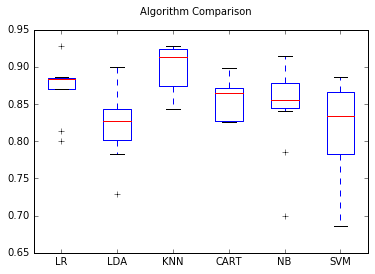

0.931428571429
[[  7  12]
 [  0 156]]
             precision    recall  f1-score   support

       blue       1.00      0.37      0.54        19
      green       0.93      1.00      0.96       156

avg / total       0.94      0.93      0.92       175



In [335]:
# Compare Algorithms
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Make predictions on validation dataset
knn = KNeighborsClassifier(n_neighbors=6, weights='distance')
knn.fit(X_train, Y_train)
predictions = knn.predict(X_validation)
print(accuracy_score(Y_validation, predictions))
print(confusion_matrix(Y_validation, predictions))
print(classification_report(Y_validation, predictions))

In [165]:
cat_predictions=knn.predict(catalog) # Contains the predicted good/bad points

In [224]:
pos_predict = np.zeros((catalog.shape[0],2))
info_predict = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 20     2. Sharpness < .25     3. Roundness < 1     4. Crowding < .1 
    #                  5. Object type = "Bright Star"     6. ML algorithm picks as good
    if ((catalog[i][5] >= 20)&(abs(catalog[i][6]) < .25)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)&(catalog[i][10] == 1)&(cat_predictions[i] == 'green')):
        pos_predict[j][0] = catalog[i][2] # Assigns X position
        pos_predict[j][1] = catalog[i][3] # Assigns Y position
        info_predict[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict = pos_predict[~np.all(pos_predict == 0, axis=1)]
info_predict = info_predict[~np.all(info_predict == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/First_Prediction.reg", pos_predict, '%5.2f')

## Second Round of ML Training

In [507]:
asci = open("/Users/tktakaro/Documents/Type-Iax-HST/jupyter_notebooks/Region_files/Second_Training_Set.reg", "r+")

text = asci.readlines()
regionX = np.zeros(2659)
regionY = np.zeros(2659)
key = []
for i in range(2659):
    A = mysplit(text[i+3], ' # ')
    regionX[i] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    regionY[i] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
    if A[1][-3] == 'l':
        key.append('green')
    elif A[1][-3] == 'u':
        key.append('blue')
    else:
        print("Error: neither blue nor green")

# Creates a array with a space for each object in the catalog, to contain only X,Y positions
pos2 = np.zeros([np.shape(info_predict)[0], 2])
info2 = np.zeros(np.shape(info_predict))

for k in range(regionX.size): # Cycles through each region item
    for i in range(info_predict.shape[0]): # Cycles through each info item produced in predictions above
        if (round(regionX[k],2) == round(pos_predict[i][0],2))&(round(regionY[k],2) == round(pos_predict[i][1],2)):
            pos2[k][0] = pos_predict[i][0] # Assigns X position
            pos2[k][1] = pos_predict[i][1] # Assigns Y position
            info2[k] = info_predict[i]
            break

# Trims all zeros from end of positions array
pos2 = pos2[~np.all(pos2 == 0, axis=1)]
info2 = info2[~np.all(info2 == 0, axis=1)]

In [4]:
asci = open("/Users/tktakaro/Documents/Type-Iax-HST/jupyter_notebooks/Region_files/Second_Training_Set.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
regionX = np.zeros(2659)
regionY = np.zeros(2659)
key = []
for i in range(2659):
    A = mysplit(text[i+3], ' # ')
    regionX[i] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    regionY[i] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
    if A[1][-3] == 'l':
        key.append('green')
    elif A[1][-3] == 'u':
        key.append('blue')
    else:
        print("Error: neither blue nor green")

# Creates a array with a space for each object in the catalog, to contain only X,Y positions
pos2 = np.zeros([np.shape(catalog)[0], 2])
info2 = np.zeros(np.shape(catalog))

for k in range(regionX.size): # Cycles through each region item
    for i in range(catalog.shape[0]): # Cycles through each info item produced in predictions above
        if (round(regionX[k],2) == round(catalog[i][2],2))&(round(regionY[k],2) == round(catalog[i][3],2)):
            pos2[k][0] = catalog[i][2] # Assigns X position
            pos2[k][1] = catalog[i][3] # Assigns Y position
            info2[k] = catalog[i]
            break

# Trims all zeros from end of positions array
pos2 = pos2[~np.all(pos2 == 0, axis=1)]
info2 = info2[~np.all(info2 == 0, axis=1)]

In [5]:
dataset = pandas.DataFrame(info2)
dataset[271] = key

array = dataset.values
X = array[:,0:271]
Y = array[:,271]
validation_size = 0.20
seed = 17

In [6]:
flat = X.flatten()
for i in range(flat.size):
    if (np.isnan(flat[i])) or (not np.isfinite(flat[i])):
        print(i//271)
        print(i%271)
        X[i//271][i%271] = 99.999

In [7]:
X_train, X_validation, Y_train, Y_validation = cross_validation.train_test_split(X, Y,
                                                    test_size=validation_size, random_state=seed)

In [8]:
# Test options and evaluation metric
num_folds = 10
num_instances = len(X_train)
seed = 19
scoring = 'accuracy'

# Spot Check Algorithms
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier(n_neighbors=44, weights='distance')))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
# evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = cross_validation.KFold(n=num_instances, n_folds=num_folds, random_state=seed)
    cv_results = cross_validation.cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.864609 (0.013979)


//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
//anaconda/lib/python3.5/site-packages/sklearn

LDA: 0.874491 (0.018321)
KNN: 0.854267 (0.021330)
CART: 0.822300 (0.021895)
NB: 0.836418 (0.023861)
SVM: 0.811936 (0.027338)


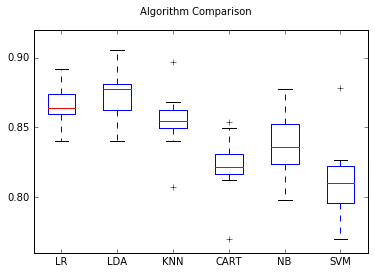

0.885338345865
[[ 50  44]
 [ 17 421]]
             precision    recall  f1-score   support

       blue       0.75      0.53      0.62        94
      green       0.91      0.96      0.93       438

avg / total       0.88      0.89      0.88       532



//anaconda/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [9]:
# Compare Algorithms
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Make predictions on validation dataset
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, Y_train)
predictions = lda.predict(X_validation)
print(accuracy_score(Y_validation, predictions))
print(confusion_matrix(Y_validation, predictions))
print(classification_report(Y_validation, predictions))

In [9]:
cat_predictions2=lda.predict(catalog) # Contains the predicted good/bad points

In [10]:
pos_predict2 = np.zeros((catalog.shape[0],2))
info_predict2 = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 10     2. Sharpness < .25     3. Roundness < 1     4. Crowding < .1 
    #                  5. Object type = "Bright Star"     6. ML algorithm picks as good
    if ((catalog[i][5] >= 10)&(abs(catalog[i][6]) < .25)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)&(catalog[i][10] == 1)&(cat_predictions2[i] == 'green')):
        pos_predict2[j][0] = catalog[i][2] # Assigns X position
        pos_predict2[j][1] = catalog[i][3] # Assigns Y position
        info_predict2[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict2 = pos_predict2[~np.all(pos_predict2 == 0, axis=1)]
info_predict2 = info_predict2[~np.all(info_predict2 == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/Second_Prediction.reg", pos_predict2, '%5.2f')

## Final Candidates

In [3]:
# Save model
import pickle
from sklearn.externals import joblib
#joblib.dump(lda, 'LDA_Model.pkl')
lda = joblib.load('LDA_Model.pkl')

//anaconda/lib/python3.5/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator LinearDiscriminantAnalysis from version pre-0.18 when using version 0.18.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:5: DeprecationWarning: The file 'LDA_Model.pkl' has been generated with a joblib version less than 0.10. Please regenerate this pickle file.


In [4]:
pos_predict4 = np.zeros((catalog.shape[0],2))
info_predict4 = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3     2. Sharpness < .25     3. Roundness < 1     4. Crowding < .1 
    #                  5. Object type = "Bright Star"     6. ML algorithm picks as good
    if ((abs(catalog[i][6]) < .3)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)&(catalog[i][10] == 1)):
        pos_predict4[j][0] = catalog[i][2] # Assigns X position
        pos_predict4[j][1] = catalog[i][3] # Assigns Y position
        info_predict4[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict4 = pos_predict4[~np.all(pos_predict4 == 0, axis=1)]
info_predict4 = info_predict4[~np.all(info_predict4 == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2010ae_Prediction.reg", pos_predict4, '%5.2f')
print(pos_predict4.shape)

(7705, 2)


## Color Magnitude Diagrams

In [5]:
asci = open(Iax_dir + "/machine_learning/New_Start(2017)/sn2010ae_200pc.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([47,2])
for i in range(47):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
infoF3 = np.zeros([region.shape[0],info_predict4.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict4.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict4[i][0])&(region[j][1] == pos_predict4[i][1]):
        infoF3[j] = info_predict4[i]
        j = j + 1
        if j == region.shape[0]: break

In [6]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_133pc.reg", "r+")

text = asci.readlines()
region = np.zeros([23,2])
for i in range(23):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF2 = np.zeros([region.shape[0], info_predict4.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF3.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF3[i][2:4]):
        infoF2[j] = infoF3[i]
        j = j + 1
        if j == region.shape[0]: break

In [7]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_67pc.reg", "r+")

text = asci.readlines()
region = np.zeros([5,2])
for i in range(5):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF1 = np.zeros([region.shape[0], info_predict4.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF2.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF2[i][2:4]):
        infoF1[j] = infoF2[i]
        j = j + 1
        if j == region.shape[0]: break

[-0.5, 3, 28, 20]

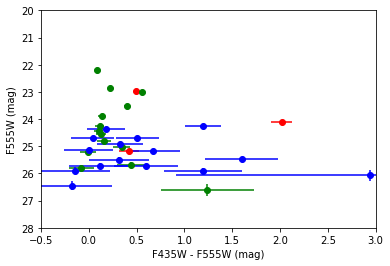

In [8]:
for i in range(infoF3.shape[0]):
    for j in range(infoF2.shape[0]):
        if np.array_equal(infoF3[i],infoF2[j]):
            infoF3[i] = np.zeros(infoF3[i].size)
for i in range(infoF2.shape[0]):
    for j in range(infoF1.shape[0]):
        if np.array_equal(infoF2[i],infoF1[j]):
            infoF2[i] = np.zeros(infoF2[i].size)

infoF2 = infoF2[~np.all(infoF2 == 0, axis=1)]
infoF3 = infoF3[~np.all(infoF3 == 0, axis=1)]
# F555W vs F435W - F555W
F435W_F1 = infoF1[:,15]
xerr_F1 = np.sqrt(infoF1[:,17]**2 + infoF1[:,30]**2)
F555W_F1 = infoF1[:,28]
yerr_F1 = infoF1[:,30]

F435W_F2 = infoF2[:,15]
xerr_F2 = np.sqrt(infoF2[:,17]**2 + infoF2[:,30]**2)
F555W_F2 = infoF2[:,28]
yerr_F2 = infoF2[:,30]

F435W_F3 = infoF3[:,15]
xerr_F3 = np.sqrt(infoF3[:,17]**2 + infoF3[:,30])
F555W_F3 = infoF3[:,28]
yerr_F3 = infoF3[:,30]

line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)

#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F435W - F555W (mag)')
plt.ylabel('F555W (mag)')
plt.axis([-.5,3,28,20])

[-0.5, 2, 27, 20]

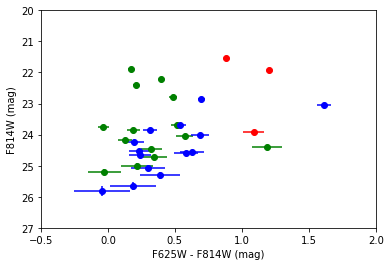

In [9]:
F625W_F1 = infoF1[:,41]
xerr2_F1 = np.sqrt(infoF1[:,43]**2 + infoF1[:,56]**2)
F814W_F1 = infoF1[:,54]
yerr2_F1 = infoF1[:,56]

F625W_F2 = infoF2[:,41]
xerr2_F2 = np.sqrt(infoF2[:,43]**2 + infoF2[:,56]**2)
F814W_F2 = infoF2[:,54]
yerr2_F2 = infoF2[:,56]

F625W_F3 = infoF3[:,41]
xerr2_F3 = np.sqrt(infoF3[:,43]**2 + infoF3[:,56]**2)
F814W_F3 = infoF3[:,54]
yerr2_F3 = infoF3[:,56]

line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)

#plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F625W - F814W (mag)')
plt.ylabel('F814W (mag)')
plt.axis([-.5,2,27,20])

[-1, 3, 3, -1]

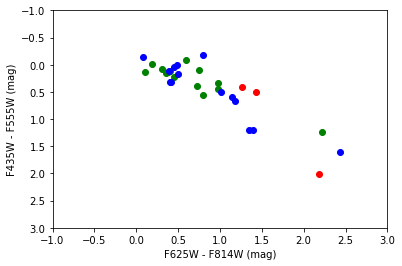

In [10]:
# Color-color plot to find clusters
plt.plot(F555W_F1 - F814W_F1, F435W_F1 - F555W_F1, 'ro', F555W_F2 - F814W_F2,  F435W_F2 - F555W_F2, 'go',
         F555W_F3 - F814W_F3,  F435W_F3 - F555W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F625W - F814W (mag)')
plt.ylabel('F435W - F555W (mag)')
plt.axis([-1,3,3,-1])

In [11]:
%matplotlib inline
import os
import glob
import matplotlib as mpl

mist_dir = Iax_dir + "/MIST_v1.0_HST_ACSWF"
# All of this MIST isochrone code comes from Asher

In [12]:
kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "log_Teff", "log_g",
                    "log_L", "z_surf", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", 
                    "ACS_WFC_F658N", "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W",
                    "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    feh_string = filename.split("/")[-1].split("_")[3] # Pulls metalicity information
    if feh_string[0] == "p":
        feh = float(feh_string[1:]) # feh is [Fe/H]
    elif feh_string[0] == "m":
        feh = -float(feh_string[1:])
    else:
        raise ValueError
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

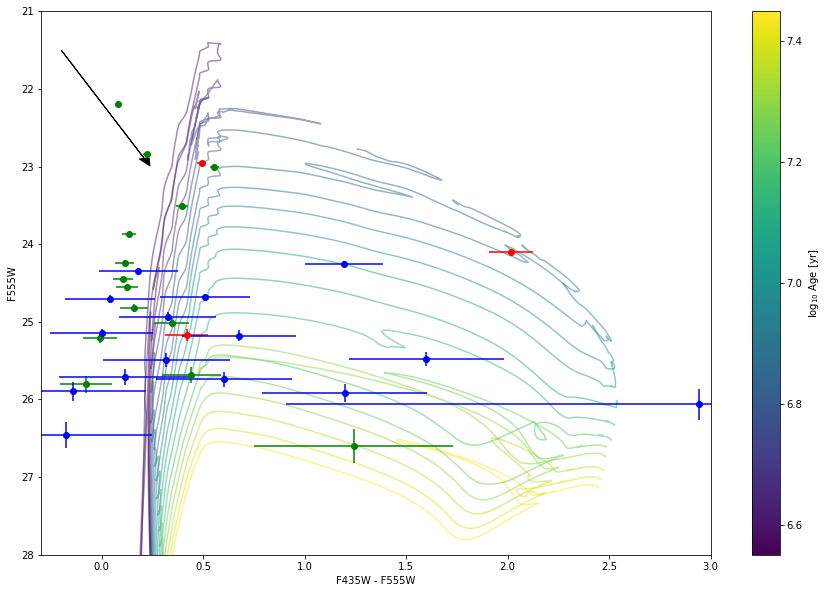

In [13]:
# fix metallicity, vary age
df = isochrones[-0.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

#ages = ages[(np.log10(5e8) < ages) & (ages < np.log10(14e9))]
ages = ages[(ages > 6.5) & (ages < 7.5)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(11.0873e6) - 1)
    F435W_ext = .509 # extinction in F435W in ESO 162-17 from NED
    F555W_ext = .394 # extinction in F555W in ESO 162-17 from NED
    Gal_ext = .50 # (B - V) galactic extinction from Stritzinger et.al. 2013
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)
#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
# Plots reddening vector
plt.arrow(-.2, 21.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')


plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(28,21)
plt.xlim(-.3, 3)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

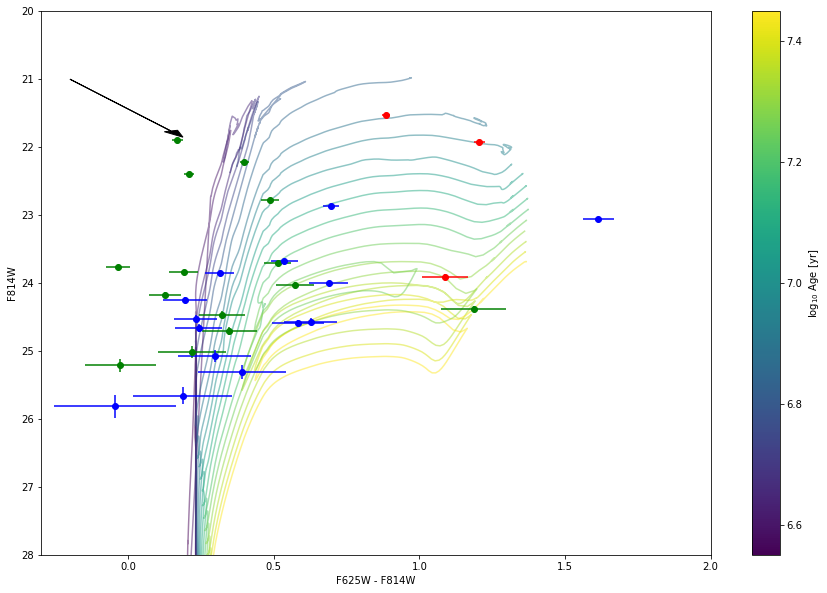

In [14]:
# fix metallicity, vary age
df = isochrones[-0.75]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

#ages = ages[(np.log10(5e8) < ages) & (ages < np.log10(14e9))]
ages = ages[(ages > 6.5) & (ages < 7.5)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = .313 # extinction in F625W in ESO 162-17 from NED
    F814W_ext = .215 # extinction in F814W in ESO 162-17 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)
#plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
# Plots reddening vector
plt.arrow(-.2, 21, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(28,20)
plt.xlim(-.3, 2)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

# Removing clusters

In [15]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/images/sn2010ae/sn2010ae_f625w_lacosmic.fits.mag.1")
ascii_2 = open(Iax_dir + "/images/sn2010ae/sn2010ae_f625w_lacosmic.fits.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(47)
for i in range(47):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [16]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_200pc.reg", "r+")
text = asci.readlines()

region = np.zeros([47,2])
for i in range(47):
    A = mysplit(text[i+3], ' # ')
    region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]

# Info for each star chosen as real 
info = np.zeros([region.shape[0],info_predict4.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict4.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict4[i][0])&(region[j][1] == pos_predict4[i][1]):
        info[j] = info_predict4[i]
        j = j + 1
        if j == region.shape[0]: break

(28, 21)

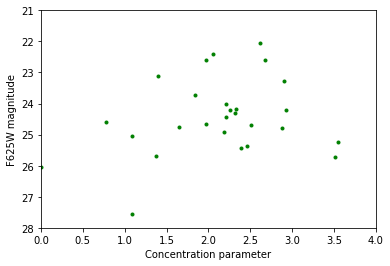

In [17]:
# Plots the concentration parameter vs magnitude
plt.plot(concentration, info[:,41], 'g.')
plt.xlabel('Concentration parameter')
plt.ylabel('F625W magnitude')
plt.xlim(0,4)
plt.ylim(28,21)

In [18]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
new_info = np.zeros(info.shape)
for i in range(47):
    if (concentration[i] < 2.3): # & (concentration[i] >= 0):
        new_info[i] = info[i]
new_info = new_info[~np.all(new_info == 0, axis=1)]

In [19]:
np.savetxt("Region_files/sn2010ae_NoClustersROI.reg", new_info[:,2:4], '%5.2f')

In [20]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_NoClustersROI_133pc.reg", "r+")
text = asci.readlines()
region = np.zeros([47,2])

for i in range(14):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

new_info1 = np.copy(new_info) # Will hold stars within 200 parsecs
new_info2 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 133 parsecs
new_info3 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 67 parsecs

j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
        new_info2[j] = new_info1[i]
        j = j + 1
        if j == region.shape[0]: break

asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_NoClustersROI_67pc.reg", "r+")
text = asci.readlines()
region = np.zeros([14,2])

for i in range(3):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
        new_info3[j] = new_info1[i]
        j = j + 1
        if j == region.shape[0]: break
                
                
for i in range(new_info1.shape[0]):
    for j in range(new_info2.shape[0]):
        if np.array_equal(new_info1[i],new_info2[j]):
            new_info1[i] = np.zeros(new_info1[i].size)
for i in range(new_info2.shape[0]):
    for j in range(new_info3.shape[0]):
        if np.array_equal(new_info2[i],new_info3[j]):
            new_info2[i] = np.zeros(new_info2[i].size)
            
new_info1 = new_info1[~np.all(new_info1 == 0, axis=1)]
new_info2 = new_info2[~np.all(new_info2 == 0, axis=1)]
new_info3 = new_info3[~np.all(new_info3 == 0, axis=1)]

In [21]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(10.1117e6) - 1)
dist_upper = 5 * (np.log10(12.1569e6) - 1)
red_lower = .18
red_upper = .92
metal_lower = 0
metal_upper = -0.50

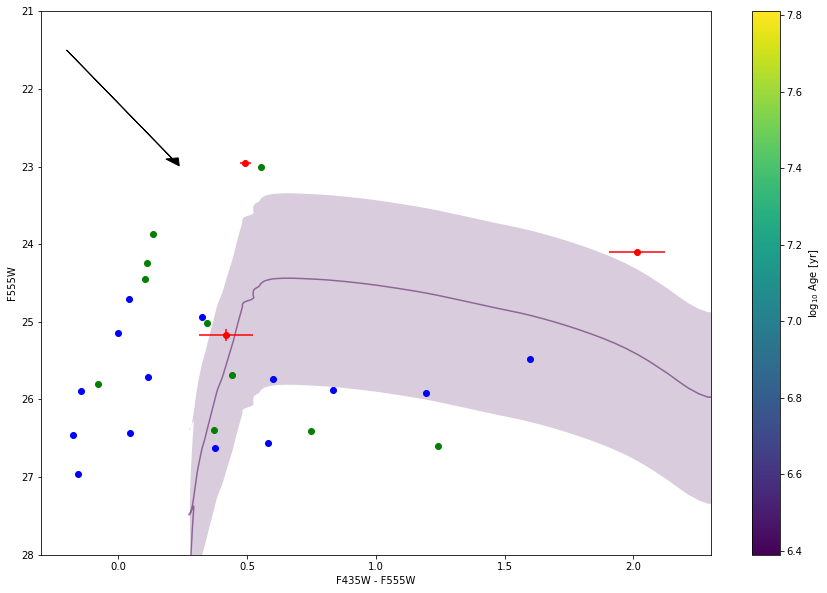

In [22]:
# fix metallicity, vary age
df = isochrones[-0.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.1) & (ages < 7.15)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(11.0873e6) - 1)
    F435W_ext = .509 # extinction in F435W in ESO 162-17 from NED
    F555W_ext = .394 # extinction in F555W in ESO 162-17 from NED
    Gal_ext = .50 # (B - V) galactic extinction from Stritzinger et.al. 2013
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,15] - new_info3[:,28], new_info3[:,28], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,17]**2 + new_info3[:,30]**2), yerr=new_info3[:,30])
#line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
#                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line2 = plt.plot(new_info2[:,15] - new_info2[:,28], new_info2[:,28], 'go')
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,15] - new_info1[:,28], new_info1[:,28], 'bo')

# Plots reddening vector
plt.arrow(-.2, 21.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')


plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(28,21)
plt.xlim(-.3, 2.3)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

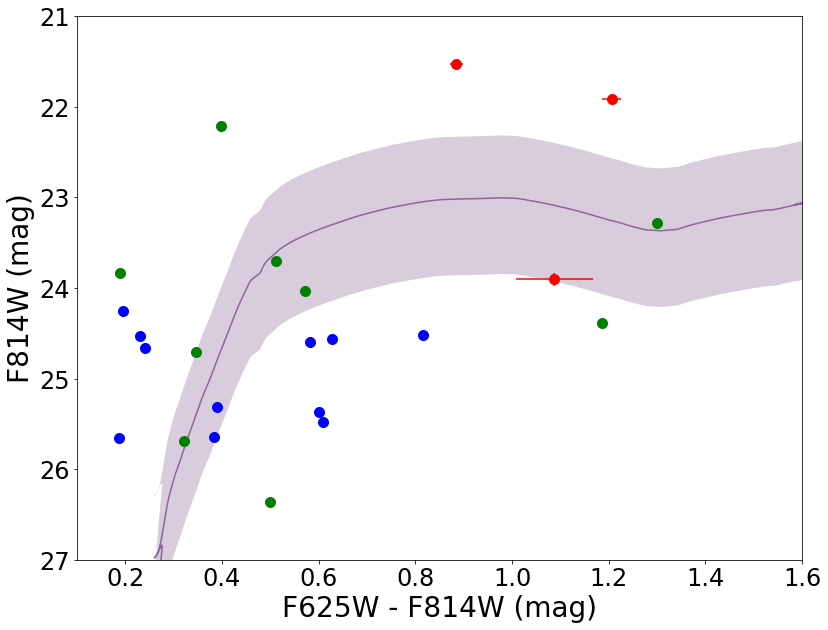

In [23]:
# fix metallicity, vary age
df = isochrones[-0.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

#ages = ages[(np.log10(5e8) < ages) & (ages < np.log10(14e9))]
ages = ages[(ages > 7.1) & (ages < 7.15)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = .313 # extinction in F625W in ESO 162-17 from NED
    F814W_ext = .215 # extinction in F814W in ESO 162-17 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(13, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,41] - new_info3[:,54], new_info3[:,54], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,43]**2 + new_info3[:,56]**2), yerr=new_info3[:,30], markersize=10)
#line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
#                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line2 = plt.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'go', markersize=10)
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'bo', markersize=10)

# Plots reddening vector
#plt.arrow(.15, 20.5, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W (mag)", fontsize=28)
plt.ylabel("F814W (mag)", fontsize=28)
plt.ylim(27,21)
plt.xlim(0.1, 1.6)
plt.tick_params(axis='both', which='major', labelsize=24)

## Crappy Chi-squared Test

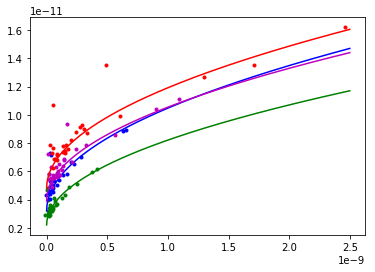

In [25]:
# Testing to find relationship between flux and flux error
from scipy.optimize import curve_fit
# This is the function which will be fed to the fitting algorithm.
def fluxerror(x, a, b):
    return a + b * np.sqrt(x)

x_array=np.linspace(0, 2.5e-9, num=1000)

plt.plot(new_info[:,13], new_info[:,14], 'g.')
plt.plot(x_array, 2.2e-12 + 1.9e-7*x_array**(1/2), 'g-')
plt.plot(new_info[:,26], new_info[:,27], 'b.')
plt.plot(x_array, 3.2e-12 + 2.3e-7*x_array**(1/2), 'b-')
plt.plot(new_info[:,39], new_info[:,40], 'm.')
plt.plot(x_array, 3.9e-12 + 2.1e-7*np.sqrt(x_array), 'm-')
plt.plot(new_info[:,52], new_info[:,53], 'r.')
plt.plot(x_array, 4.8e-12 + 2.25e-7*np.sqrt(x_array), 'r-')

In [36]:
# For now, setup Salpeter IMF, because it's less likely to fail than Kroupa.
import scipy.integrate as integrate

def SalpeterUnNorm(m):
    return m**-2.35
def invSalpeter(u, lower, upper):
    norm = integrate.quad(SalpeterUnNorm, lower, upper)[0] # To go back to how it was, replace the 6's with .075's
    return (lower**(-1.35) - 1.35 * norm * u)**(-1/1.35)

In [24]:
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

In [41]:
# Reruns through the isochrones the user specifies to get mags, colors, etc.
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages >= 6.5) & (ages <= 8.5)]

for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext
    mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext
    mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext
    mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext
    age_cmd[age] = (mag_435, mag_555, mag_625, mag_814)
n_ages = i + 1


SN_pos = np.array([1791.1695, 1924.3393])

CChi = np.zeros([10,2,n_ages]) # This is the array which measure crappy chi-squared across all filters
n10SN = 0
nlow = 0
for i in range(10):
    Gal_ext = .18 + i * (1/9) * (.92 - .18)
    k = 0
    for age, (mag_435, mag_555, mag_625, mag_814) in age_cmd.items():
        mags_435 = mag_435 + 3.610*Gal_ext
        mags_555 = mag_555 + 2.792*Gal_ext
        mags_625 = mag_625 + 2.219*Gal_ext
        mags_814 = mag_814 + 1.526*Gal_ext
    
    
        phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
        temp = 0 # This will hold the distance for each data point to the line
    
        # Sets the radial dispersion for the region
        sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(11.09e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
        flat = (100 * 206265)/(11.09e6 * .05) # 100 parsecs in pixels
        flat_int = int(np.round(flat*5))
        for j in range(new_info.shape[0]):
            # Removes "stars" with mag > 90 in any band
            if (new_info[j,15] > 90) or (new_info[j,28] > 90) or (new_info[j,41] > 90) or (new_info[j,54] > 90):
                continue
            if new_info[j,5] >= 10:
                n10SN += 1
            else: nlow += 1
        
            # Uses physical distance between star and SN position to weight each star
            phys_dist = np.sqrt((SN_pos[0] - new_info[j,2])**2 + (SN_pos[1] - new_info[j,3])**2)
            weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
            phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
            phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
            # Adds the difference in mags for each data point in quadrature.
            #temp += phys_dist_weight * np.amin((new_info[j,15] - mag_435)**2/mag_435 + (new_info[j,28] - mag_555)**2/mag_555
            #                + (new_info[j,41] - mag_625)**2/mag_625 + (new_info[j,54] - mag_814)**2/mag_814)
            temp += (phys_dist_weight * np.amin(np.sqrt((new_info[j,15] - mags_435)**2
              + (new_info[j,28] - mags_555)**2 + (new_info[j,41] - mags_625)**2 + (new_info[j,54] - mags_814)**2)))**2
    
        # There is one star removed not counted, as they have >90 mag in some filter
        phys_dist_temp /= (new_info.shape[0] - 1)
        CChi[i,0,k] = age
        CChi[i,1,k] = np.sqrt(temp)/phys_dist_temp
        k = k + 1
    
print("There are ", n10SN/(10 * n_ages), "stars above signal-to-noise of 10, and ", nlow/n_ages, "stars below.")

KeyError: -0.5

In [42]:
CChi_new = np.zeros(CChi.shape)
sort_array = np.argsort(CChi[0,0,:])
for i in range(41):
    index = sort_array[i]
    CChi_new[:,:,i] = CChi[:,:,index]
CChi = CChi_new

ValueError: could not broadcast input array from shape (5,7,4,1,4,1) into shape (5,7,4,1)

In [43]:
plt.plot(CChi[0,0,:], CChi[0,1,:], '#E53935', CChi[1,0,:], CChi[1,1,:], '#D81B60', CChi[2,0,:], CChi[2,1,:], '#8E24AA',
         CChi[3,0,:], CChi[3,1,:], '#5E35B1', CChi[4,0,:], CChi[4,1,:], '#3949AB', CChi[5,0,:], CChi[5,1,:], '#1E88E5',
         CChi[6,0,:], CChi[6,1,:], '#00ACC1', CChi[7,0,:], CChi[7,1,:], '#00897B', CChi[8,0,:], CChi[8,1,:], '#43A047',
         CChi[9,0,:], CChi[9,1,:], '#C0CA33');
for i in range(10):
    print(.18 + i * (1/9) * (.92 - .18))

IndexError: index 5 is out of bounds for axis 0 with size 5

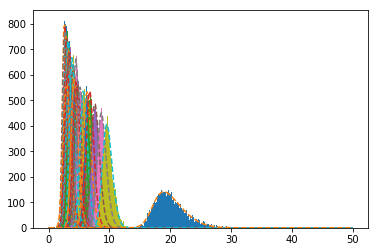

In [31]:
# This cell and the one below are for run fit in magnitude space.
x = np.linspace(0,50,300)
probs = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.51)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs.append(skew(CChi[4,1,i], *popt)/norm)

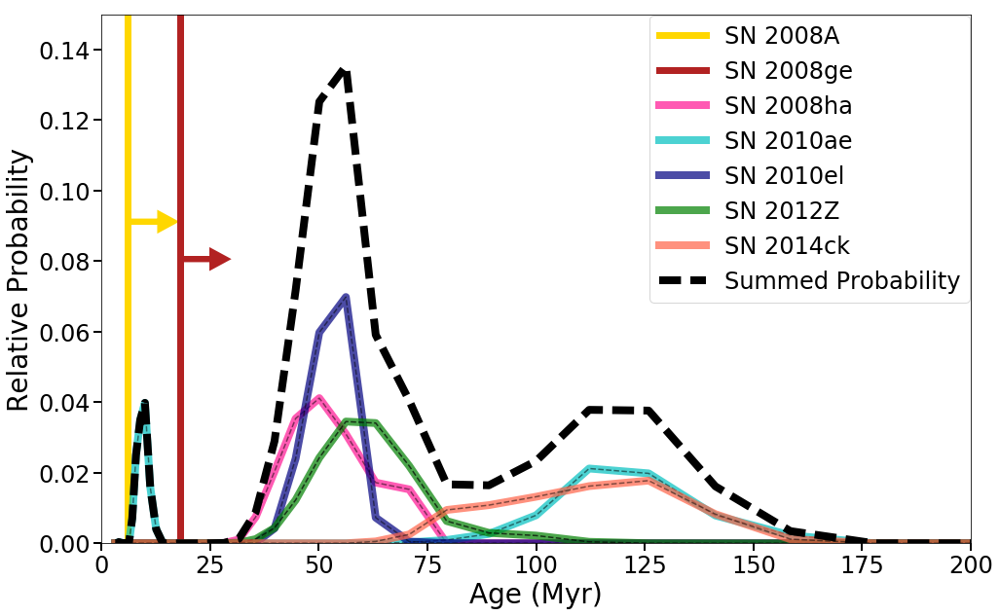

In [31]:
# Total Plot (using reddening = .51)
plt.figure(figsize=(16,10));
plt.ylabel("Relative Probability", fontsize=28)
plt.xlabel("Age (Myr)",fontsize=28)
plt.tick_params(axis='both', which='major', labelsize=24, length=8, width=2)


plt.axvline(x=6, color='gold', linestyle='-', linewidth=7, label="SN 2008A")
plt.arrow(5.5, .0912, 8, 0, linestyle='-', linewidth=6, width=0, head_width=0.004, head_length=3, fc='gold', ec='gold')

plt.axvline(x=18, color='firebrick', linestyle='-', linewidth=7, label="SN 2008ge")
plt.arrow(17.5, .0806, 8, 0, linestyle='-', linewidth=6, width=0, head_width=0.004, head_length=3, fc='firebrick', ec='firebrick')

prob_08ha = np.load("Region_files/08ha_Mag_probs.npy")
norm_08ha = np.trapz(prob_08ha, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha, color='deeppink', linestyle='-', alpha=.7, linewidth=8, label='SN 2008ha')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha, 'k--', alpha=.5)

prob_10ae = np.load("Region_files/10ae_Mag_probs.npy")
norm_10ae = np.trapz(prob_10ae, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, color='c', linestyle='-', alpha=.7, linewidth=8, label='SN 2010ae')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, 'k--', alpha=.5)

prob_10el = np.load("Region_files/10el_Mag_probs.npy")
norm_10el = np.trapz(prob_10el, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el, color='navy', linestyle='-', alpha=.7, linewidth=8, label='SN 2010el')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el, 'k--', alpha=.5)

prob_12Z = np.load("Region_files/12Z_Mag_probs.npy")
norm_12Z = np.trapz(prob_12Z, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z, color='green', linestyle='-', alpha=.7, linewidth=8, label='SN 2012Z')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z, 'k--', alpha=.7)

prob_14ck = np.load("Region_files/14ck_Mag_probs.npy")
norm_14ck = np.trapz(prob_14ck, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck, color='tomato', linestyle='-', alpha=.7, linewidth=8, label='SN 2014ck')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck, 'k--', alpha=.5)

prob_summed = prob_10ae/norm_10ae + prob_08ha/norm_08ha + prob_10el/norm_10el + prob_14ck/norm_14ck + prob_12Z/norm_12Z
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_summed, 'k--', linewidth=8, label='Summed Probability')
plt.ylim(0,.141)

#plt.axvspan(0,15, alpha=.5, color='grey', label='Allowed Wolf \n Rayet Ages')

plt.xlim(0, 200)
plt.ylim(0, 0.15)
plt.legend(bbox_to_anchor=(.999,.9985), loc=1, borderaxespad=0, fontsize=24)
plt.savefig('Net_PDF.pdf', dpi=1000)

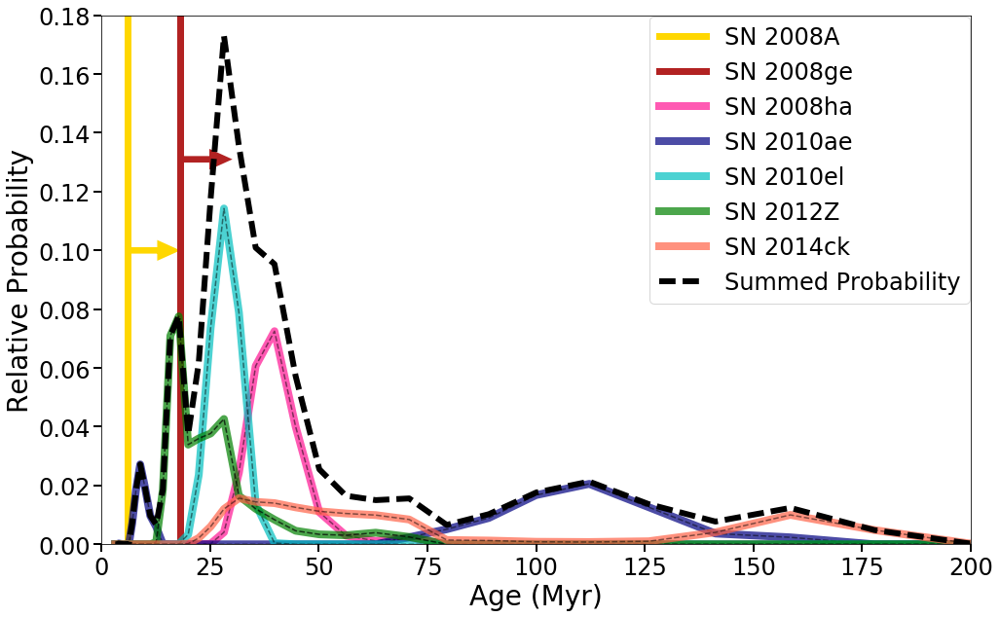

In [27]:
# Total Plot (using reddening = .51)
plt.figure(figsize=(16,10));
plt.ylabel("Relative Probability", fontsize=28)
plt.xlabel("Age (Myr)",fontsize=28)
plt.tick_params(axis='both', which='major', labelsize=24, length=8, width=2)


plt.axvline(x=6, color='gold', linestyle='-', linewidth=7, label="SN 2008A")
plt.arrow(5.5, .1, 8, 0, linestyle='-', linewidth=6, width=0, head_width=0.004, head_length=3, fc='gold', ec='gold')

plt.axvline(x=18, color='firebrick', linestyle='-', linewidth=7, label="SN 2008ge")
plt.arrow(17.5, .131, 8, 0, linestyle='-', linewidth=6, width=0, head_width=0.004, head_length=3, fc='firebrick', ec='firebrick')

prob_08ha = np.load("Region_files/08ha_Mag_probs_clusters.npy")
norm_08ha = np.trapz(prob_08ha, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha, color='deeppink', linestyle='-', alpha=.7, linewidth=8, label='SN 2008ha')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha, 'k--', alpha=.5)

prob_10ae = np.load("Region_files/10ae_Mag_probs_clusters.npy")
norm_10ae = np.trapz(prob_10ae, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, color='navy', linestyle='-', alpha=.7, linewidth=8, label='SN 2010ae')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, 'k--', alpha=.5)

prob_10el = np.load("Region_files/10el_Mag_probs_clusters.npy")
norm_10el = np.trapz(prob_10el, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el, color='c', linestyle='-', alpha=.7, linewidth=8, label='SN 2010el')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el, 'k--', alpha=.5)

prob_12Z = np.load("Region_files/12Z_Mag_probs_clusters.npy")
norm_12Z = np.trapz(prob_12Z, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z, color='green', linestyle='-', alpha=.7, linewidth=8, label='SN 2012Z')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z, 'k--', alpha=.7)

prob_14ck = np.load("Region_files/14ck_Mag_probs_clusters.npy")
norm_14ck = np.trapz(prob_14ck, 10**(CChi[0,3,:,3,0])/1e6)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck, color='tomato', linestyle='-', alpha=.7, linewidth=8, label='SN 2014ck')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck, 'k--', alpha=.5)

prob_summed = prob_10ae/norm_10ae + prob_08ha/norm_08ha + prob_10el/norm_10el + prob_14ck/norm_14ck + prob_12Z/norm_12Z
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_summed, 'k--', linewidth=6, label='Summed Probability')
plt.ylim(0,.141)

#plt.axvspan(0,15, alpha=.5, color='grey', label='Allowed Wolf \n Rayet Ages')

plt.xlim(0, 200)
plt.ylim(0, 0.18)
plt.legend(bbox_to_anchor=(.999,.9985), loc=1, borderaxespad=0, fontsize=24)
#plt.savefig('Net_PDF.pdf', dpi=1000)

In [727]:
# Integrates PDF from 0 to 15 Myr to get probability of Core-Collapse
print(10**(CChi[0,3,10,3,0])/1e6)
prob_CC = (np.trapz(prob_08ha[:11], 10**(CChi[0,3,:11,3,0])/1e6) + np.trapz(prob_10ae[:11], 10**(CChi[0,3,:11,3,0])/1e6)
           + np.trapz(prob_10el[:11], 10**(CChi[0,3,:11,3,0])/1e6) + np.trapz(prob_12Z[:11], 10**(CChi[0,3,:11,3,0])/1e6)
           + np.trapz(prob_14ck[:11], 10**(CChi[0,3,:11,3,0])/1e6))/(np.trapz(prob_08ha, 10**(CChi[0,3,:,3,0])/1e6)
           + np.trapz(prob_10ae, 10**(CChi[0,3,:,3,0])/1e6) + np.trapz(prob_10el, 10**(CChi[0,3,:,3,0])/1e6)
           + np.trapz(prob_12Z, 10**(CChi[0,3,:,3,0])/1e6) + np.trapz(prob_14ck, 10**(CChi[0,3,:,3,0])/1e6))
print("Probability is ", 
      100 * prob_CC,
     "%")

10.0
Probability is  2.023053763 %


In [21]:
# Determining median age and confidence interval
print(10**(CChi[0,3,:,3,0][np.argmax(prob_summed)])/1e6, CChi[0,3,:,3,0][np.argmax(prob_summed)])
# 1 sigma bounds in log space
print(np.trapz(prob_summed[20:31], 10**(CChi[0,3,20:31,3,0])/1e6)/5, CChi[0,3,20,3,0], CChi[0,3,31,3,0])
print("or ", CChi[0,3,11,3,0], CChi[0,3,25,3,0])
print()
# 1 sigma bounds in normal space
print(np.trapz(prob_summed[11:30], 10**(CChi[0,3,11:30,3,0])/1e6)/5)
print(10**(CChi[0,3,11,3,0])/1e6, 10**(CChi[0,3,30,3,0])/1e6)
print(10**(CChi[0,3,11,3,0])/1e6 - 10**(CChi[0,3,25,3,0])/1e6, 10**(CChi[0,3,30,3,0])/1e6 - 10**(CChi[0,3,25,3,0])/1e6)

56.234132519 7.75
0.668484029005 7.5 8.05
or  7.05 7.75

0.631220279771
11.220184543 100.0
-45.013947976 43.765867481


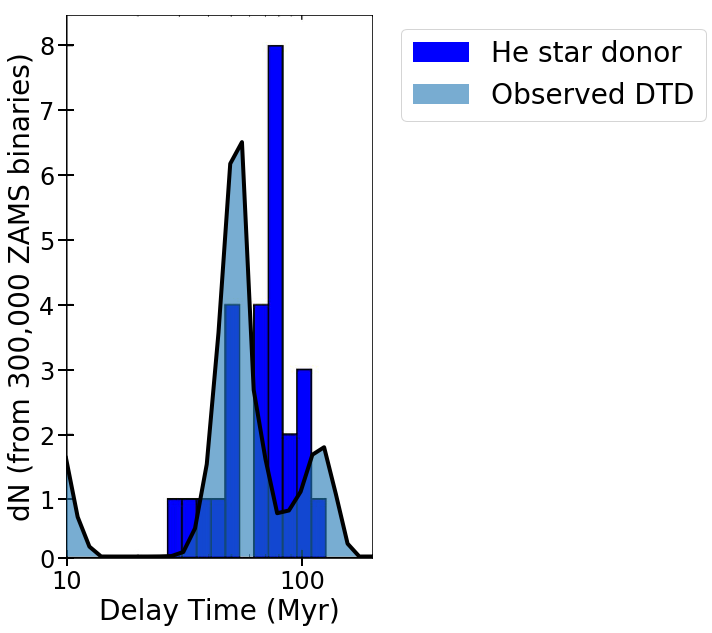

In [24]:
fig, ax = plt.subplots(figsize=(15, 10))
image=im.imread("/Users/tktakaro/Google Drive/FLASH/Iax_DTD.jpeg")
ax.imshow(image, zorder=1, label='He star donor')

ax.hist([0], color='blue', label='He star donor')
ax.plot(70 + (1259-70)/3 * (CChi[0,3,10:,3,0]-7), 915 - 5000*prob_summed[10:], 'k-', linewidth=4)
plt.fill_between(70 + (1259-70)/3 * (CChi[0,3,10:,3,0]-7), 915, 915 - 5000*prob_summed[10:], zorder=2, alpha=.6, label='Observed DTD')
plt.xlim([70,587])
plt.ylim([918,0])
ax.set_yticks([918, 818, 709, 600, 490, 380.5, 271, 161, 52])
ax.set_yticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax.set_xticks([71, 469])
ax.set_xticklabels([10, 100])
plt.ylabel("dN (from 300,000 ZAMS binaries)", fontsize=28)
plt.xlabel("Delay Time (Myr)",fontsize=28)
plt.tick_params(axis='both', which='major', direction='inout', labelsize=24, length=16, width=2)
ax.legend(bbox_to_anchor=(1.05,1), loc=2, fontsize=28)

plt.savefig('/Users/tktakaro/Google Drive/FLASH/Iax_DTD_overlay.jpeg', dpi=1000)
"""
ax.plot(70 + (1259-70)/3 * (CChi[0,3,10:,3,0]-7), 919 - 5000*prob_summed[10:], 'k-', linewidth=5)
plt.xlim([70,1259])
plt.ylim([918,0])
ax.set_yticks([918, 818, 709, 600, 490, 380.5, 271, 161, 52])
ax.set_yticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax.set_xticks([70, 468, 863, 1259])
ax.set_xticklabels([10, 100, 1000, 10000])
plt.show()
""";

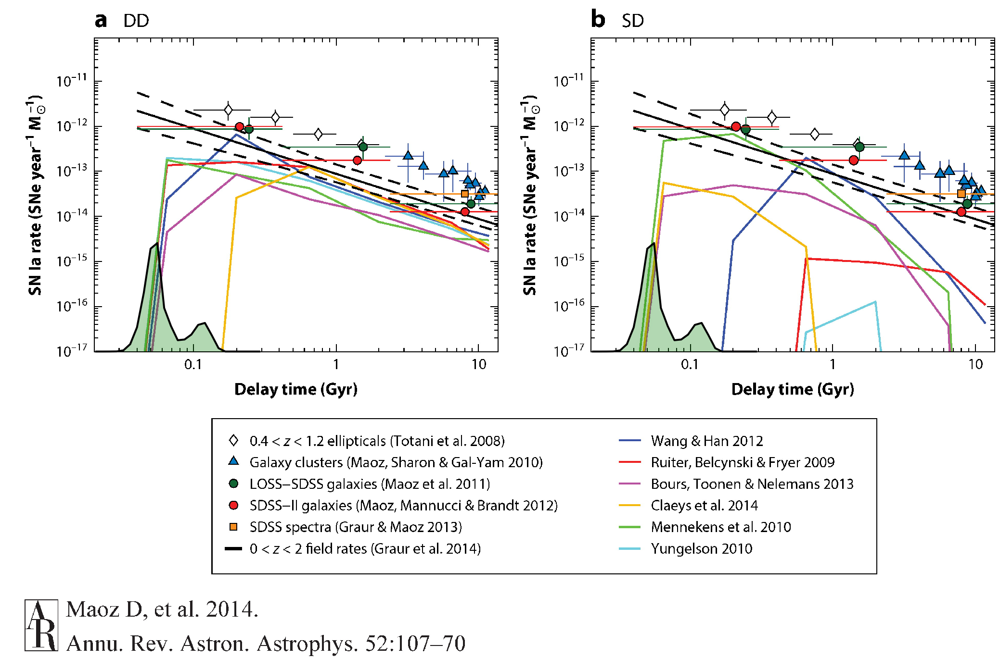

In [30]:
fig, ax = plt.subplots(figsize=(38, 25))
image=im.imread("/Users/tktakaro/Google Drive/FLASH/Ia_DTD.jpeg")
imgplot = ax.imshow(image, zorder=1)
plt.axis('off')

ax.plot(140 + (3772-200)/6.8 * (CChi[0,3,16:,3,0]-7), 1340 - 3000*prob_summed[16:], 'k-', linewidth=4)
plt.fill_between(140 + (3772-200)/6.8 * (CChi[0,3,16:,3,0]-7), 1340, 1340 - 3000*prob_summed[16:], zorder=2, alpha=.3, facecolor='green')

ax.plot(2060 + (3772-200)/6.8 * (CChi[0,3,16:,3,0]-7), 1340 - 3000*prob_summed[16:], 'k-', linewidth=4)
plt.fill_between(2060 + (3772-200)/6.8 * (CChi[0,3,16:,3,0]-7), 1340, 1340 - 3000*prob_summed[16:], zorder=2, alpha=.3, facecolor='green')
#plt.savefig('/Users/tktakaro/Google Drive/FLASH/Ia_DTD_overlay.jpeg', dpi=1000)

In [34]:
print(np.sum(prob_summed))

print(np.trapz(prob_summed[:24])/np.sum(prob_summed))
print(np.trapz(prob_summed[:25])/np.sum(prob_summed))
print(10**(CChi[4,0,23])/1e6, 10**(CChi[4,0,25])/1e6)

0.786498666596
0.312795965832
0.490222047129
44.6683592151 56.234132519


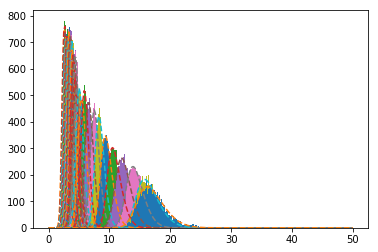

In [35]:
# Fitting for host exctinction = .18
x = np.linspace(0,50,300)
probs0 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.18)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs0.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs0.append(skew(CChi[0,1,i], *popt)/norm)

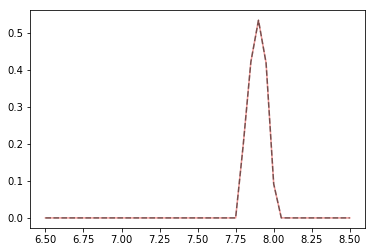

In [36]:
# Gal_ext = .18
plt.plot(CChi[0,0,:], probs0, '#E53935', alpha=.5)
plt.plot(CChi[0,0,:], probs0, 'k--', alpha=.5)
norm0 = np.trapz(probs0, 10**(CChi[0,0,:])/1e6)

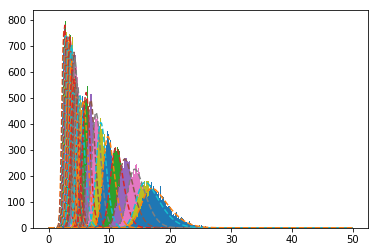

In [37]:
# Fitting for host exctinction = .26
x = np.linspace(0,50,300)
probs1 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.26)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs1.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs1.append(skew(CChi[1,1,i], *popt)/norm)

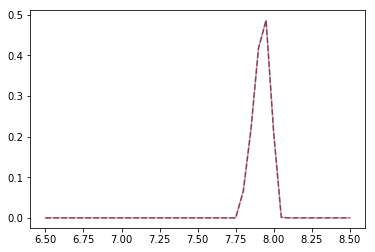

In [38]:
# Gal_ext = .26
plt.plot(CChi[1,0,:], probs1, '#D81B60', alpha=.5)
plt.plot(CChi[1,0,:], probs1, 'k--', alpha=.5)
norm1 = np.trapz(probs1, 10**(CChi[1,0,:])/1e6)

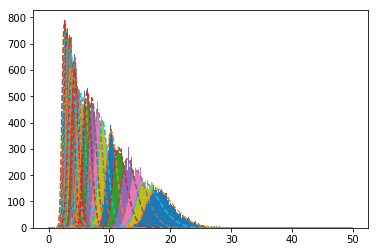

In [39]:
# Fitting for host exctinction = .34
x = np.linspace(0,50,300)
probs2 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.34)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs2.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs2.append(skew(CChi[2,1,i], *popt)/norm)

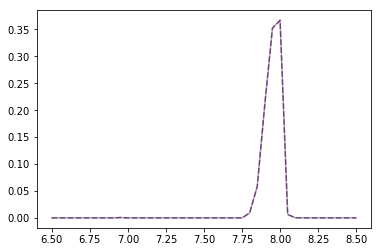

In [40]:
# Gal_ext = .34
plt.plot(CChi[2,0,:], probs2, '#8E24AA', alpha=.5)
plt.plot(CChi[2,0,:], probs2, 'k--', alpha=.5)
norm2 = np.trapz(probs2, 10**(CChi[2,0,:])/1e6)

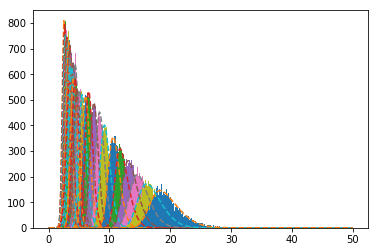

In [41]:
# Fitting for host exctinction = .43
x = np.linspace(0,50,300)
probs3 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.43)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs3.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs3.append(skew(CChi[3,1,i], *popt)/norm)

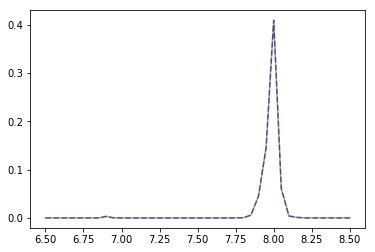

In [42]:
# Gal_ext = .43
plt.plot(CChi[3,0,:], probs3, '#5E35B1', alpha=.5)
plt.plot(CChi[3,0,:], probs3, 'k--', alpha=.5)
norm3 = np.trapz(probs3, 10**(CChi[3,0,:])/1e6)

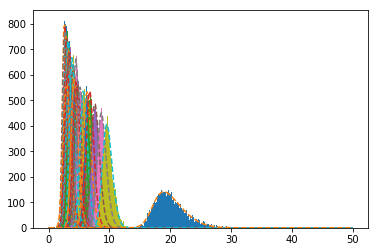

In [43]:
# Fitting for host exctinction = .51
x = np.linspace(0,50,300)
probs4 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.51)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs4.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs4.append(skew(CChi[4,1,i], *popt)/norm)

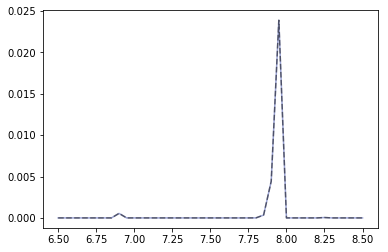

In [44]:
# Gal_ext = .51
plt.plot(CChi[4,0,:], probs4, '#3949AB', alpha=.5)
plt.plot(CChi[4,0,:], probs4, 'k--', alpha=.5)
norm4 = np.trapz(probs4, 10**(CChi[4,0,:])/1e6)

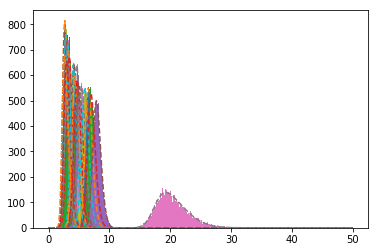

In [45]:
# Fitting for host exctinction = .59
x = np.linspace(0,50,300)
probs5 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.59)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs5.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs5.append(skew(CChi[5,1,i], *popt)/norm)

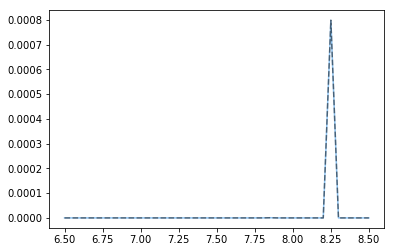

In [46]:
# Gal_ext = .59
plt.plot(CChi[5,0,:], probs5, '#1E88E5', alpha=.5)
plt.plot(CChi[5,0,:], probs5, 'k--', alpha=.5)
norm5 = np.trapz(probs5, 10**(CChi[5,0,:])/1e6)

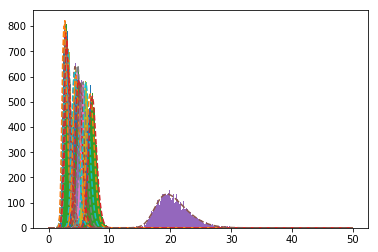

In [47]:
# Fitting for host exctinction = .67
x = np.linspace(0,50,300)
probs6 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.67)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs6.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs6.append(skew(CChi[6,1,i], *popt)/norm)

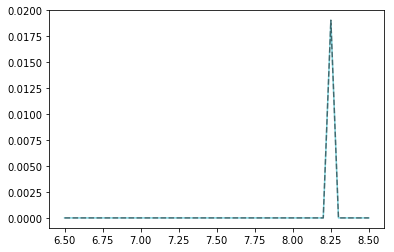

In [48]:
# Gal_ext = .67
plt.plot(CChi[6,0,:], probs6, '#00ACC1', alpha=.5)
plt.plot(CChi[6,0,:], probs6, 'k--', alpha=.5)
norm6 = np.trapz(probs6, 10**(CChi[6,0,:])/1e6)

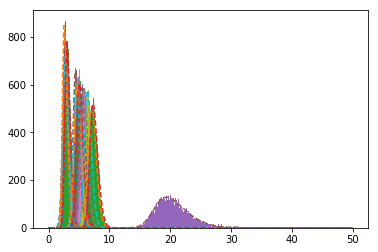

In [49]:
# Fitting for host exctinction = .76
x = np.linspace(0,50,300)
probs7 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.76)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs7.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs7.append(skew(CChi[7,1,i], *popt)/norm)

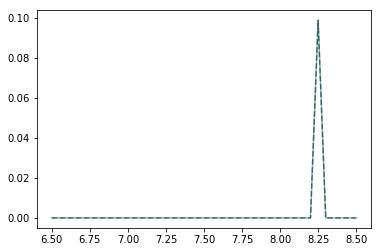

In [50]:
# Gal_ext = .76
plt.plot(CChi[7,0,:], probs7, '#00897B', alpha=.5)
plt.plot(CChi[7,0,:], probs7, 'k--', alpha=.5)
norm7 = np.trapz(probs7, 10**(CChi[7,0,:])/1e6)

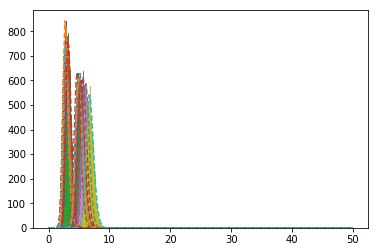

In [51]:
# Fitting for host exctinction = .84
x = np.linspace(0,50,300)
probs8 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.84)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs8.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs8.append(skew(CChi[8,1,i], *popt)/norm)

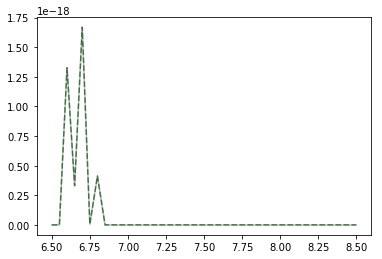

In [52]:
# Gal_ext = .84
plt.plot(CChi[8,0,:], probs8, '#43A047', alpha=.5)
plt.plot(CChi[8,0,:], probs8, 'k--', alpha=.5)
norm8 = np.trapz(probs8, 10**(CChi[8,0,:])/1e6)

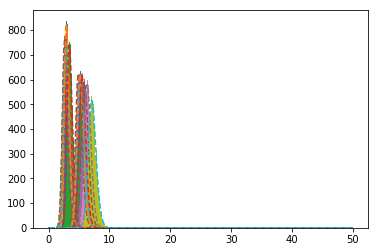

In [53]:
# Fitting for host exctinction = .92
x = np.linspace(0,50,300)
probs9 = []
for i, age in enumerate(ages):
    filename="MC_10ae_MagFit_[FeH]=-.50/CChi_false_{Age}_{Red}.npy".format(Age=np.round(age,decimals=2), Red=0.92)
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs9.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,50,301))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 4, 3, 3))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs9.append(skew(CChi[9,1,i], *popt)/norm)

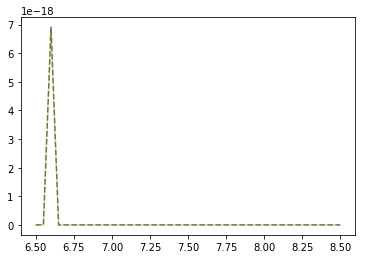

In [54]:
# Gal_ext = .92
plt.plot(CChi[9,0,:], probs9, '#C0CA33', alpha=.5)
plt.plot(CChi[9,0,:], probs9, 'k--', alpha=.5)
norm9 = np.trapz(probs9, 10**(CChi[9,0,:])/1e6)

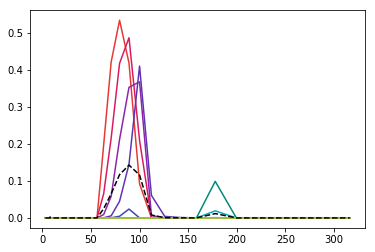

In [57]:
mu = .50
sigma = .42
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
probs_tot = (np.array(probs0)*norm(.18) + np.array(probs1)*norm(.2622) + np.array(probs2)*norm(.3444) + np.array(probs3)*norm(.4267)
            + np.array(probs4)*norm(.5089) + np.array(probs5)*norm(.5911) + np.array(probs6)*norm(.6733) + np.array(probs7)*norm(.7556)
            + np.array(probs8)*norm(.8378) + np.array(probs9)*norm(.92))/(norm(.18) + norm(.2622) + norm(.3444) + norm(.4267)
                + norm(.5089) + norm(.5911) + norm(.6733) + norm(.7556) + norm(.8378) + norm(.92))

plt.plot(10**(CChi[0,0,:])/1e6, probs0, '#E53935', 10**(CChi[1,0,:])/1e6, probs1, '#D81B60',
         10**(CChi[2,0,:])/1e6, probs2, '#8E24AA', 10**(CChi[3,0,:])/1e6, probs3, '#5E35B1',
         10**(CChi[4,0,:])/1e6, probs4, '#3949AB', 10**(CChi[5,0,:])/1e6, probs5, '#1E88E5',
         10**(CChi[6,0,:])/1e6, probs6, '#00ACC1', 10**(CChi[7,0,:])/1e6, probs7, '#00897B',
         10**(CChi[8,0,:])/1e6, probs8, '#43A047', 10**(CChi[9,0,:])/1e6, probs9, '#C0CA33',
         10**(CChi[4,0,:])/1e6, probs_tot, 'k--');
np.save("New_Start(2017)/10ae_Mag_probs", probs_tot)

## Making subplots

In [97]:
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.93) & (ages < 7.97)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')

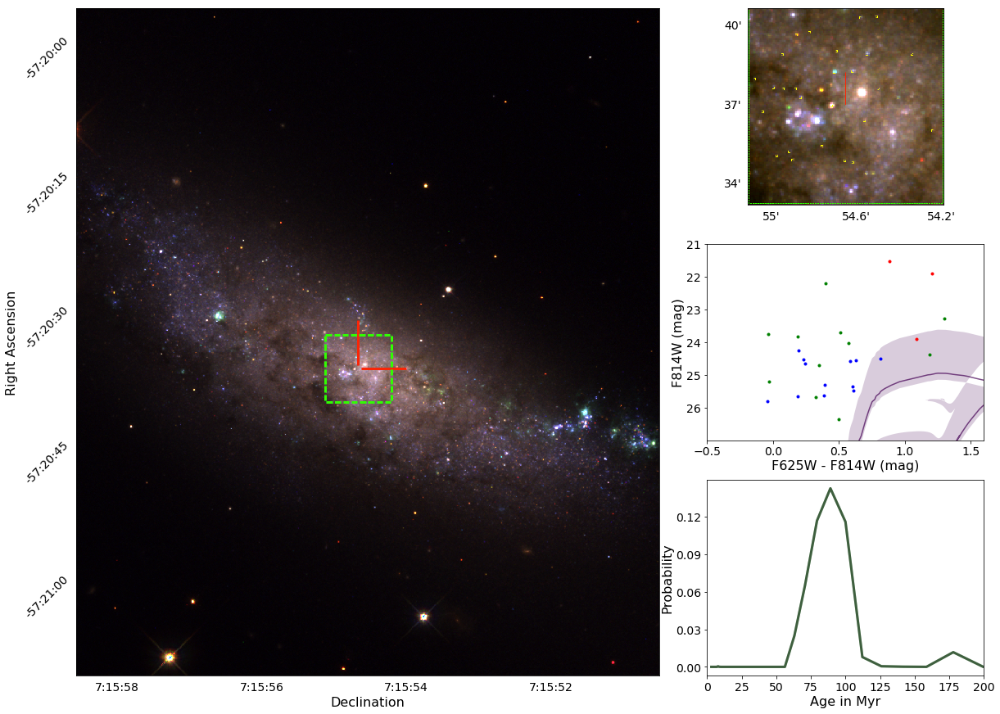

In [110]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.15, hspace=0.2)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010ae_3.5kpc.4kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 765/(58.552 - 50.505)
x_start = x_tick*.552
ax0.set_xticks([x_start, x_start + 2*x_tick, x_start + 4*x_tick, x_start + 6*x_tick])
ax0.set_xticklabels(['7:15:58', '7:15:56', '7:15:54', '7:15:52'], **tick_font)
y_tick = 877/(130.95 - 56.66)
y_start = y_tick*3.34
ax0.set_yticks([y_start, y_start + 15*y_tick, y_start + 30*y_tick, y_start + 45*y_tick,
                y_start + 60*y_tick])
ax0.set_yticklabels(['-57:20:00', '-57:20:15', '-57:20:30', '-57:20:45', '-57:21:00'],
                    rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Right Ascension", **axis_font)
ax0.set_ylabel("Declination", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010ae_400pc.400pc.png')
ax1.imshow(image)
# Setting the ticks
x_tick = 874/(55.109 - 54.191)
x_start = x_tick*.109
ax1.set_xticks([x_start, x_start + .4*x_tick, x_start + .8*x_tick])
ax1.set_xticklabels(["55'", "54.6'", "54.2'"], **tick_font)
y_tick = 877/(40.61 - 33.17)
y_start = y_tick*.61
ax1.set_yticks([y_start, y_start + 3*y_tick, y_start + 6*y_tick])
ax1.set_yticklabels(["40'", "37'", "34'"], **tick_font)
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'b.')
line2 = ax2.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'g.')
line3 = ax2.plot(new_info3[:,41] - new_info3[:,54], new_info3[:,54], 'r.')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.1)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(27,21)
ax2.set_xlim(.1, 1.6)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(21, 27))
ax2.set_xticks(np.arange(-.50,2,.5))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[4,0,:]/1e6))
ax3.plot(10**(CChi[4,0,:])/1e6, probs_tot, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[4,0,:])/1e6, probs_tot, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.1)
ax3.yaxis.set_label_coords(-.12, .5)
ax3.set_xlim(0,200)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .15, .03));

plt.savefig('2010ae_Fig.pdf', dpi=1000)

## Now Try using DOLPHOT output from Curtis' parameters

In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog_new = np.loadtxt(Iax_dir+"/new_files/sn2010ae/sn2010ae") #sn2010ae5") #.out2")

In [3]:
pos_predict_new = np.zeros((catalog_new.shape[0],2))
info_predict_new = np.zeros(np.shape(catalog_new))

j = 0 # Iteration variable for positions array
for i in range(catalog_new.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog_new[i][5] >= 3.5)&(abs(catalog_new[i][6]) < .3)&(abs(catalog_new[i][7]) < 1)
        &(catalog_new[i][9] < .1)):
        pos_predict_new[j][0] = catalog_new[i][2] # Assigns X position
        pos_predict_new[j][1] = catalog_new[i][3] # Assigns Y position
        info_predict_new[j] = catalog_new[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_new = pos_predict_new[~np.all(pos_predict_new == 0, axis=1)]
info_predict_new = info_predict_new[~np.all(info_predict_new == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("New_Start(2017)/sn2010ae_Prediction_new.reg", pos_predict_new, '%5.2f')

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010ae_200pc_new.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([20,2])
for i in range(20):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_new = np.zeros([region.shape[0],info_predict_new.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_new.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_new[i][0])&(region[j][1] == pos_predict_new[i][1]):
        info_new[j] = info_predict_new[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2010ae/sn2010ae_f625w_crc1.mag.1")
ascii_2 = open(Iax_dir + "/new_files/sn2010ae/sn2010ae_f625w_crc1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(20)
for i in range(20):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

(-4, -11)

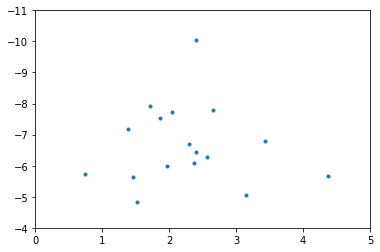

In [6]:
plt.plot(concentration, info_new[:,41] - 5*(np.log10(11.0873e6) - 1), '.')
plt.xlim(0,5)
plt.ylim(-4,-11)

In [7]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info = np.zeros(info_new.shape)
for i in range(20):
    if (concentration[i] < 2.3): #not ((concentration[i] > 2.3) and (info_new[i,41] - 5*(np.log10(11.0873e6) - 1) < -6)):
        info[i] = info_new[i]
info = info[~np.all(info == 0, axis=1)]

#np.savetxt("New_Start(2017)/sn2010ae_NoClustersROI_new.reg", info[:,2:4], '%5.2f')

In [8]:
print(info.shape)

(11, 271)


In [9]:
import matplotlib as mpl
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [10]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(10.1117e6) - 1)
dist_upper = 5 * (np.log10(12.1569e6) - 1)
red_lower = .18
red_upper = .92
metal_lower = 0
metal_upper = -0.50

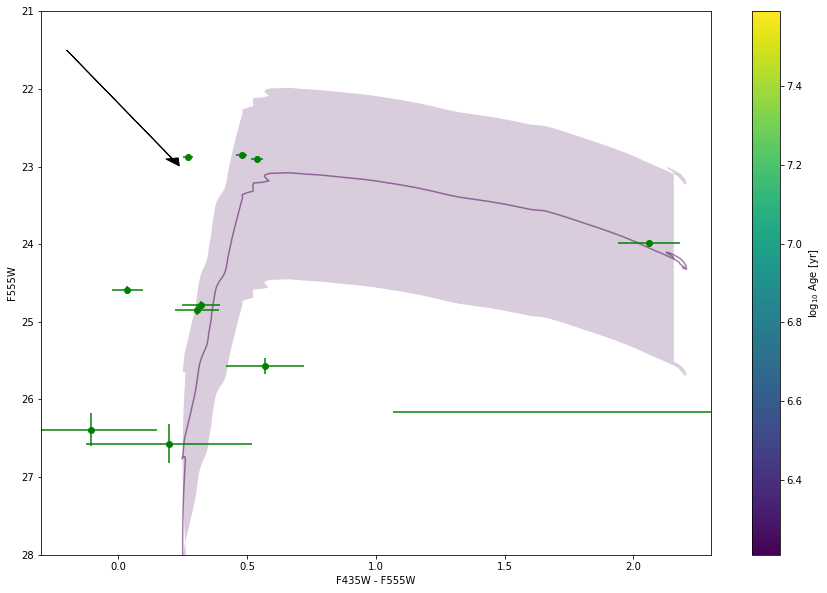

In [11]:
# fix metallicity, vary age
df = isochrones[-0.43]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 6.89) & (ages < 6.91)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(11.0873e6) - 1)
    F435W_ext = .509 # extinction in F435W in ESO 162-17 from NED
    F555W_ext = .394 # extinction in F555W in ESO 162-17 from NED
    Gal_ext = .50 # (B - V) galactic extinction from Stritzinger et.al. 2013
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(info[:,15] - info[:,28], info[:,28], fmt='go', 
                     xerr=np.sqrt(info[:,17]**2 + info[:,30]**2), yerr=info[:,30])

# Plots reddening vector
plt.arrow(-.2, 21.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')


plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(28,21)
plt.xlim(-.3, 2.3)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

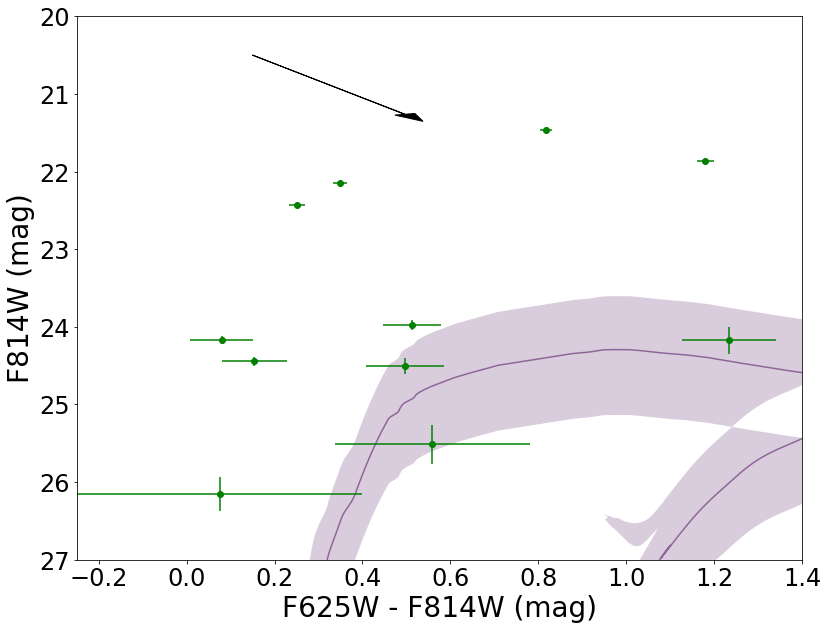

In [12]:
# fix metallicity, vary age
df = isochrones[-0.43]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 8.09) & (ages < 8.11)]
#ages = ages[(ages > 6.99) & (ages < 7.01)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = .313 # extinction in F625W in ESO 162-17 from NED
    F814W_ext = .215 # extinction in F814W in ESO 162-17 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(13, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(info[:,41] - info[:,54], info[:,54], fmt='go', 
                     xerr=np.sqrt(info[:,43]**2 + info[:,56]**2), yerr=info[:,30])

# Plots reddening vector
plt.arrow(.15, 20.5, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W (mag)", fontsize=28)
plt.ylabel("F814W (mag)", fontsize=28)
plt.ylim(27,20)
plt.xlim(-0.25, 1.4)
plt.tick_params(axis='both', which='major', labelsize=24)

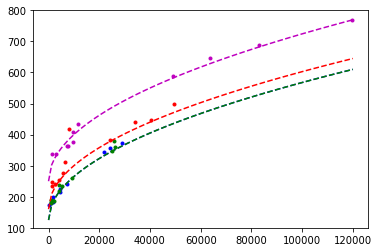

In [13]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 120000, num=100)

plt.plot(info[:,11], info[:,17]/1.0857 * info[:,11], 'b.')
plt.plot(x_array, 125 + 1.4*np.sqrt(x_array), 'b--')
plt.plot(info[:,24], info[:,30]/1.0857 * info[:,24], 'g.')
plt.plot(x_array, 125 + 1.4*np.sqrt(x_array), 'g--')
plt.plot(info[:,37], info[:,43]/1.0857 * info[:,37], 'r.')
plt.plot(x_array, 160 + 1.4*np.sqrt(x_array), 'r--')
plt.plot(info[:,50], info[:,56]/1.0857 * info[:,50], 'm.')
plt.plot(x_array, 250 + 1.5*np.sqrt(x_array), 'm--')
plt.ylim(100,800)
plt.show()

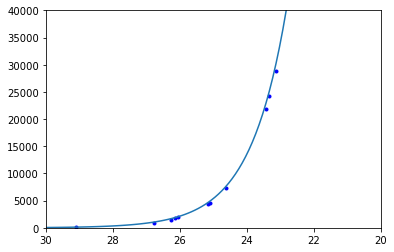

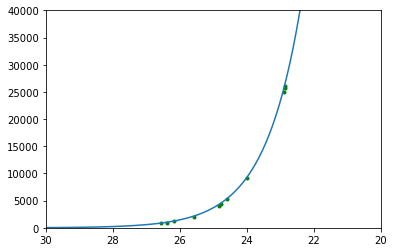

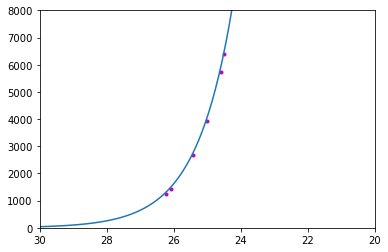

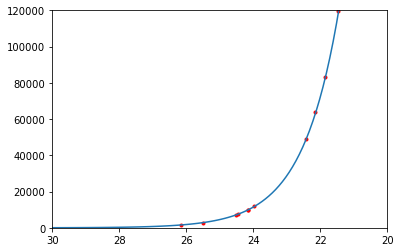

In [14]:
x_array = np.linspace(20,30,100)
plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info[:,15], info[:,11], 'b.')
plt.plot(x_array, 1.9*1402 * 10**((25.769 - x_array)/2.5))
plt.show()

plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info[:,28], info[:,24], 'g.')
plt.plot(x_array, 1.9*1002 * 10**((25.722 - x_array)/2.5))
plt.show()

plt.ylim(0,8000)
plt.xlim(30,20)
plt.plot(info[:,41], info[:,37], 'm.')
plt.plot(x_array, 1.9*1078 * 10**((25.743 - x_array)/2.5))
plt.show()

plt.ylim(0,120000)
plt.xlim(30,20)
plt.plot(info[:,54], info[:,50], 'r.')
plt.plot(x_array, 1.9*1478 * 10**((25.525 - x_array)/2.5))
plt.show()

In [15]:
metallicity = np.array([-.55, -.49, -.43, -.37, -.31])
reddening = np.array([.08, .22, .36, .50, .64, .78, .92])
SN_pos = np.array([1777.1903, 1896.8087]) #([1772.8225, 1889.2074])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*red
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*red
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*red
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(11.09e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(11.09e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (info[l,15] > 90) or (info[l,28] > 90) or (info[l,41] > 90) or (info[l,54] > 90):
                    print(age)
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info[l,2])**2 + (SN_pos[1] - info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info[l,15] - mag_435)**2
                  + (info[l,28] - mag_555)**2 + (info[l,41] - mag_625)**2 + (info[l,54] - mag_814)**2)))**2
    
            # There is one stars not counted, as it has >90 mag in some filter
            phys_dist_temp /= (info.shape[0])
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [16]:
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
import scipy.integrate as integrate

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

In [17]:
print(info.shape)

(11, 271)


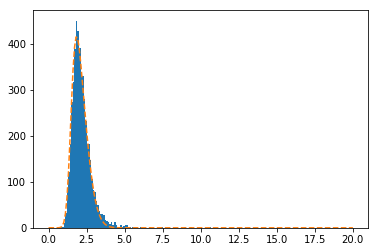

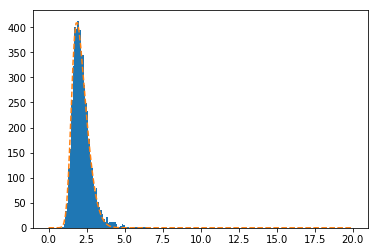

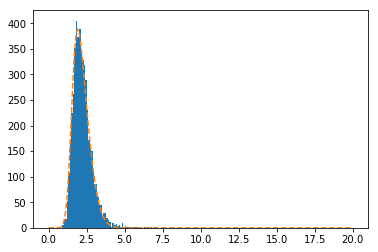

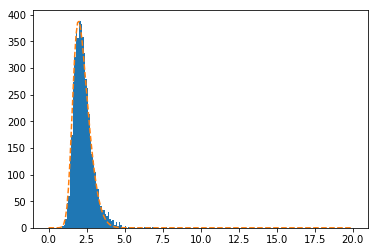

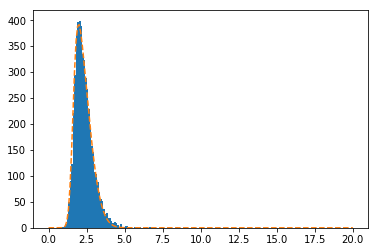

...

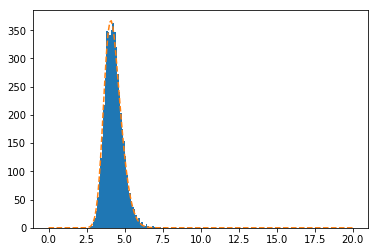

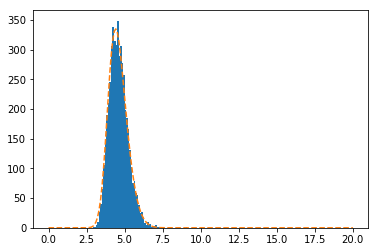

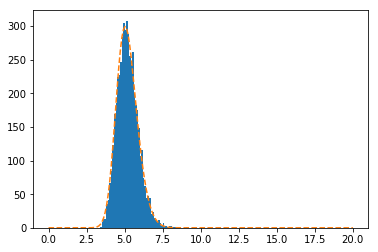

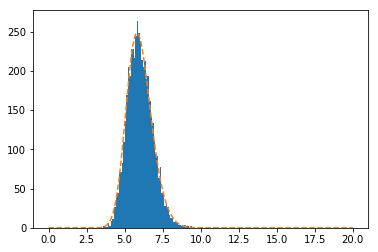

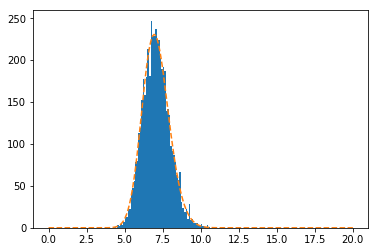

In [18]:
x = np.linspace(0,20,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_10ae_Complete/CChi_false_ages.npy") #"MC_10ae_Curtis_Dolphot/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(13./11. * CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

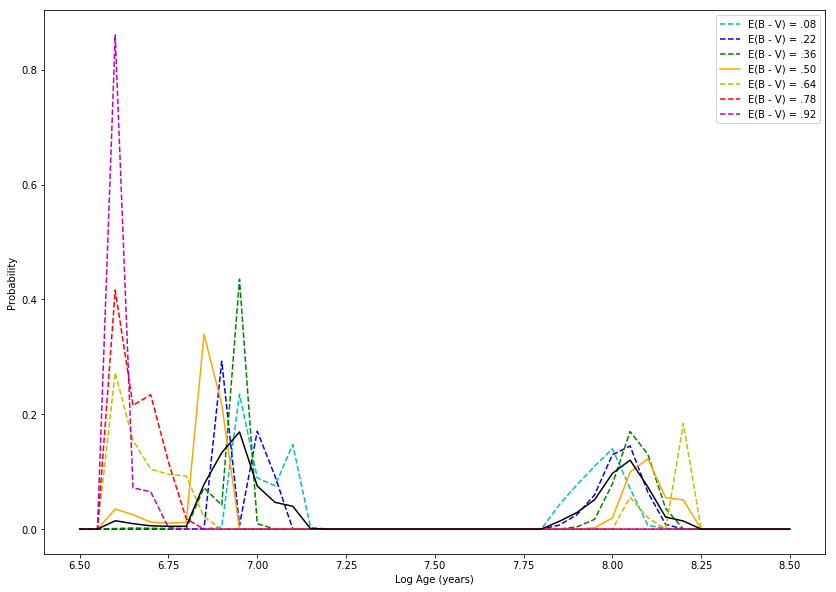

6.95


In [19]:
# Plotting all reddenings, marginalizing over metallicity
plt.figure(figsize=(14,10));

# Applying a gaussian prior
mu = -0.43
sigma = .06
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_red0 = (probs[0,0,:] * norm(-.55) + probs[1,0,:] * norm(-.49) + probs[2,0,:] * norm(-.43) + 
            probs[3,0,:] * norm(-.37) + probs[4,0,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red1 = (probs[0,1,:] * norm(-.55) + probs[1,1,:] * norm(-.49) + probs[2,1,:] * norm(-.43) + 
            probs[3,1,:] * norm(-.37) + probs[4,1,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red2 = (probs[0,2,:] * norm(-.55) + probs[1,2,:] * norm(-.49) + probs[2,2,:] * norm(-.43) + 
            probs[3,2,:] * norm(-.37) + probs[4,2,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red3 = (probs[0,3,:] * norm(-.55) + probs[1,3,:] * norm(-.49) + probs[2,3,:] * norm(-.43) + 
            probs[3,3,:] * norm(-.37) + probs[4,3,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red4 = (probs[0,4,:] * norm(-.55) + probs[1,4,:] * norm(-.49) + probs[2,4,:] * norm(-.43) + 
            probs[3,4,:] * norm(-.37) + probs[4,4,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red5 = (probs[0,5,:] * norm(-.55) + probs[1,5,:] * norm(-.49) + probs[2,5,:] * norm(-.43) + 
            probs[3,5,:] * norm(-.37) + probs[4,5,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))
probs_red6 = (probs[0,6,:] * norm(-.55) + probs[1,6,:] * norm(-.49) + probs[2,6,:] * norm(-.43) + 
            probs[3,6,:] * norm(-.37) + probs[4,6,:] * norm(-.31))/(
            norm(-.55) + norm(-.49) + norm(-.43) + norm(-.37) + norm(-.31))

plt.plot(CChi[0,3,:,3,0], probs_red0/np.sum(probs_red0), 'c--', label='E(B - V) = .08')
plt.plot(CChi[0,3,:,3,0], probs_red1/np.sum(probs_red1), 'b--', label='E(B - V) = .22')
plt.plot(CChi[0,3,:,3,0], probs_red2/np.sum(probs_red2), 'g--', label='E(B - V) = .36')
plt.plot(CChi[0,3,:,3,0], probs_red3/np.sum(probs_red3), 'orange', label='E(B - V) = .50')
plt.plot(CChi[0,3,:,3,0], probs_red4/np.sum(probs_red4), 'y--', label='E(B - V) = .64')
plt.plot(CChi[0,3,:,3,0], probs_red5/np.sum(probs_red5), 'r--', label='E(B - V) = .78')
plt.plot(CChi[0,3,:,3,0], probs_red6/np.sum(probs_red6), 'm--', label='E(B - V) = .92')

mu = .50
sigma = .42
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs_red0 * norm(.08) + probs_red1 * norm(.22) + 
            probs_red2 * norm(.36) + probs_red3 * norm(.50) + 
            probs_red4 * norm(.64) + probs_red5 * norm(.78) + 
            probs_red6 * norm(.92))
plt.plot(CChi[0,3,:,3,0], probs_tot/np.sum(probs_tot), 'k')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,3,:,3,0][np.argmax(probs_tot)])
#np.save("New_Start(2017)/10ae_Mag_probs", probs_tot)

In [728]:
breaks = (10**(CChi[0,3,1:,3,0])/1e6 + 10**(CChi[0,3,:-1,3,0])/1e6)/2
widths = 10**(CChi[0,3,1:,3,0])/1e6 - 10**(CChi[0,3,:-1,3,0])/1e6

breaks_mod = np.zeros(breaks.shape[0] + 2)
for i in range(40):
    breaks_mod[i+1] = breaks[i]
breaks_mod[0] = breaks[0] - widths[0]
breaks_mod[-1] = breaks[-1] + widths[-1]

widths_mod = breaks_mod[1:] - breaks_mod[:-1]

In [729]:
x_interp = np.zeros(83)
for i in range(41):
    x_interp[2*i] = breaks_mod[i]
    if i != 41:
        x_interp[2*i+1] = 10**(CChi[0,3,i,3,0])/1e6
x_interp[-1] = breaks_mod[-1]

norm_08ha = np.trapz(prob_08ha, 10**(CChi[0,3,:,3,0])/1e6)
prob_08ha_interp = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha)
norm_10ae = np.trapz(prob_10ae, 10**(CChi[0,3,:,3,0])/1e6)
prob_10ae_interp = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae)
norm_10el = np.trapz(prob_10el, 10**(CChi[0,3,:,3,0])/1e6)
prob_10el_interp = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el)
norm_12Z = np.trapz(prob_12Z, 10**(CChi[0,3,:,3,0])/1e6)
prob_12Z_interp = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z)
norm_14ck = np.trapz(prob_14ck, 10**(CChi[0,3,:,3,0])/1e6)
prob_14ck_interp = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck)

areas_08ha = np.zeros(41)
heights_08ha = np.zeros(41)
areas_10ae = np.zeros(41)
heights_10ae = np.zeros(41)
areas_10el = np.zeros(41)
heights_10el = np.zeros(41)
areas_12Z = np.zeros(41)
heights_12Z = np.zeros(41)
areas_14ck = np.zeros(41)
heights_14ck = np.zeros(41)
for i in range(41):
    areas_08ha[i] = np.trapz(prob_08ha_interp[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_08ha[i] = areas_08ha[i]/widths_mod[i]
    areas_10ae[i] = np.trapz(prob_10ae_interp[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_10ae[i] = areas_10ae[i]/widths_mod[i]
    areas_10el[i] = np.trapz(prob_10el_interp[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_10el[i] = areas_10el[i]/widths_mod[i]
    areas_12Z[i] = np.trapz(prob_12Z_interp[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_12Z[i] = areas_12Z[i]/widths_mod[i]
    areas_14ck[i] = np.trapz(prob_14ck_interp[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_14ck[i] = areas_14ck[i]/widths_mod[i]

In [730]:
# Check median & 1-sigma confidence interval for 08ha, 10el, 12Z, and if 14ck is an outlier
x_interp = np.linspace(3, 300, 1000)
interp_08ha = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_08ha[:])
interp_10ae = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_10ae[:])
interp_10el = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_10el[:])
interp_12Z = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_12Z[:])
interp_14ck = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_14ck[:])

cdf_08ha = np.zeros([interp_08ha.shape[0], 2])
cdf_10ae = np.zeros([interp_08ha.shape[0], 2])
cdf_10el = np.zeros([interp_08ha.shape[0], 2])
cdf_12Z = np.zeros([interp_08ha.shape[0], 2])
cdf_14ck = np.zeros([interp_08ha.shape[0], 2])
for i in range(interp_08ha.shape[0]):
    cdf_08ha[i,0] = x_interp[i]
    cdf_08ha[i,1] = np.sum(interp_08ha[:i+1])/np.sum(interp_08ha[:])
    cdf_10ae[i,0] = x_interp[i]
    cdf_10ae[i,1] = np.sum(interp_10ae[:i+1])/np.sum(interp_10ae[:])
    cdf_10el[i,0] = x_interp[i]
    cdf_10el[i,1] = np.sum(interp_10el[:i+1])/np.sum(interp_10el[:])
    cdf_12Z[i,0] = x_interp[i]
    cdf_12Z[i,1] = np.sum(interp_12Z[:i+1])/np.sum(interp_12Z[:])
    cdf_14ck[i,0] = x_interp[i]
    cdf_14ck[i,1] = np.sum(interp_14ck[:i+1])/np.sum(interp_14ck[:])

cdf_array = (cdf_08ha + cdf_10el + cdf_12Z)/3
 
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .9973)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .9937)/2.))], '\n')

print(cdf_14ck[:,0][np.argmin(np.abs(cdf_14ck[:,1] - (1 - .9973)/2.))])
print(cdf_14ck[:,0][np.argmin(np.abs(cdf_14ck[:,1] - .5))])
print(cdf_14ck[:,0][np.argmin(np.abs(cdf_14ck[:,1] - (1 + .9973)/2.))], '\n')

print(cdf_10ae[:,0][np.argmin(np.abs(cdf_10ae[:,1] - (1 - .9973)/2.))])
print(cdf_10ae[:,0][np.argmin(np.abs(cdf_10ae[:,1] - .5))])
print(cdf_10ae[:,0][np.argmin(np.abs(cdf_10ae[:,1] - (1 + .9973)/2.))])

32.1351351351
54.7297297297
105.27027027 

60.6756756757
113.594594595
171.864864865 

6.56756756757
116.864864865
172.756756757


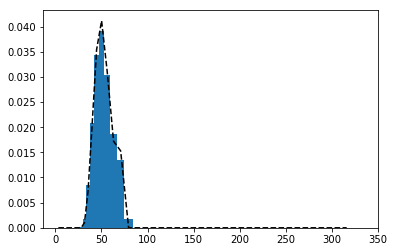

1.0


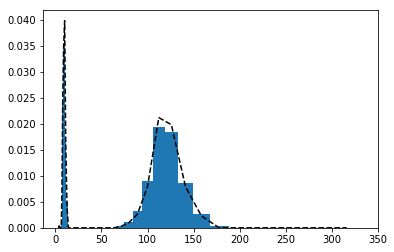

1.0


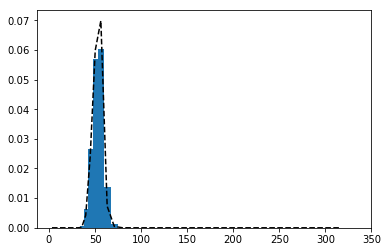

1.0


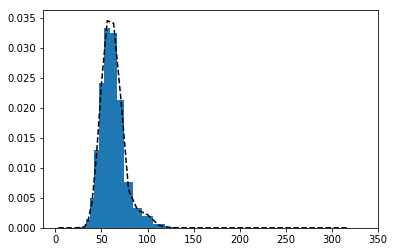

1.0


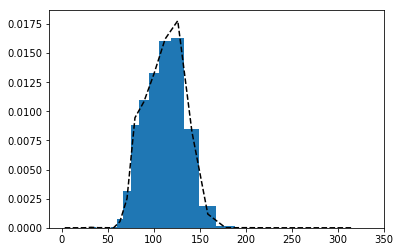

1.0
1.0


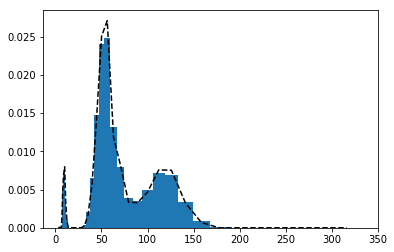

In [731]:
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_08ha/norm_08ha, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_08ha, width=widths_mod)
plt.show()
print(np.sum(heights_08ha*widths_mod))

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_10ae, width=widths_mod)
plt.show()
print(np.sum(heights_10ae*widths_mod))

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10el/norm_10el, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_10el, width=widths_mod)
plt.show()
print(np.sum(heights_10el*widths_mod))

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_12Z/norm_12Z, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_12Z, width=widths_mod)
plt.show()
print(np.sum(heights_12Z*widths_mod))

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_14ck/norm_14ck, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_14ck, width=widths_mod)
plt.show()
print(np.sum(heights_14ck*widths_mod))

heights_tot = heights_08ha + heights_10ae + heights_10el + heights_12Z + heights_14ck
heights_tot = heights_tot/np.sum(heights_tot*widths_mod)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_summed/5., 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_tot, width=widths_mod)
print(np.sum(heights_tot*widths_mod))

[ 39.81071706  89.12509381  50.11872336  79.43282347  89.12509381]
 final_simplex: (array([[ 79.43282332,  12.31990181],
       [ 79.43282274,  12.31981097],
       [ 79.43282325,  12.31992092]]), array([-2.43033615, -2.43033613, -2.43033613]))
           fun: -2.4303361532315289
       message: 'Optimization terminated successfully.'
          nfev: 156
           nit: 79
        status: 0
       success: True
             x: array([ 79.43282332,  12.31990181])


//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:31: RuntimeWarning: divide by zero encountered in log


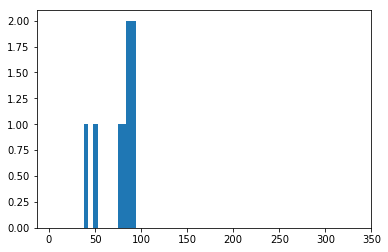

In [732]:
# Create CDFs from each PDF
cdf_08ha = np.zeros_like(heights_08ha)
cdf_10ae = np.zeros_like(heights_08ha)
cdf_10el = np.zeros_like(heights_08ha)
cdf_12Z = np.zeros_like(heights_08ha)
cdf_14ck = np.zeros_like(heights_08ha)
for i in range(cdf_08ha.size):
    cdf_08ha[i] = np.sum(heights_08ha[:i+1]*widths_mod[:i+1])
    cdf_10ae[i] = np.sum(heights_10ae[:i+1]*widths_mod[:i+1])
    cdf_10el[i] = np.sum(heights_10el[:i+1]*widths_mod[:i+1])
    cdf_12Z[i] = np.sum(heights_12Z[:i+1]*widths_mod[:i+1])
    cdf_14ck[i] = np.sum(heights_14ck[:i+1]*widths_mod[:i+1])
    
# Generate 5 random numbers to get the corresponding 5 ages
rand = np.random.random(5)
ind = [np.argmin(abs(rand[0] - cdf_08ha)), np.argmin(abs(rand[1] - cdf_10ae)), np.argmin(abs(rand[2] - cdf_10el)),
       np.argmin(abs(rand[3] - cdf_12Z)), np.argmin(abs(rand[4] - cdf_14ck))]
print(10**(CChi[0,3,ind,3,0])/1e6)

# Create bar graph w/ 5 ages
heights_instance = np.zeros_like(heights_08ha)
for i in range(5):
    heights_instance[ind[i]] += 1
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_instance, width=widths_mod)

nll = lambda *args: -lnlike(*args)
ln_sum = np.sum(10**(CChi[0,3,:,3,0])/1e6)
x0 = np.array([20, 1.5], dtype=float)
result = optimize.minimize(nll, x0, method = 'Nelder-Mead', args=(10**(CChi[0,3,:,3,0])/1e6, heights_instance))
a_ml, b_ml = result["x"]
print(result)

In [572]:
nll = lambda *args: -lnlike(*args)
ln_sum = np.sum(10**(CChi[0,3,:,3,0])/1e6)
x0 = np.array([20, 1], dtype=float)

a_list = []
b_list = []
for j in range(5000):
    # Generate 5 random numbers to get the corresponding 5 ages
    rand = np.random.random(5)
    ind = [np.argmin(abs(rand[0] - cdf_08ha)), np.argmin(abs(rand[1] - cdf_10ae)), np.argmin(abs(rand[2] - cdf_10el)),
           np.argmin(abs(rand[3] - cdf_12Z)), np.argmin(abs(rand[4] - cdf_14ck))]

    # Create bar graph w/ 5 ages
    heights_instance = np.zeros_like(heights_08ha)
    for i in range(5):
        heights_instance[ind[i]] += 1

    result = optimize.minimize(nll, x0, method = 'Nelder-Mead', args=(10**(CChi[0,3,:,3,0])/1e6, heights_instance))
    a_ml, b_ml = result["x"]
    a_list.append(a_ml)
    b_list.append(b_ml)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:28: RuntimeWarning: divide by zero encountered in log
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in log
//anaconda/lib/python3.5/site-packages/scipy/optimize/optimize.py:528: RuntimeWarning: invalid value encountered in subtract
  numpy.max(numpy.abs(fsim[0] - fsim[1:])) <= fatol):
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:25: RuntimeWarning: divide by zero encountered in log


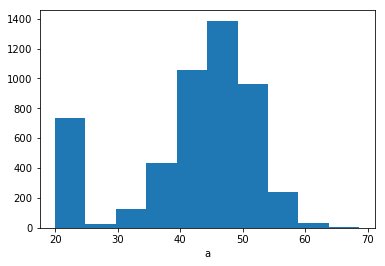

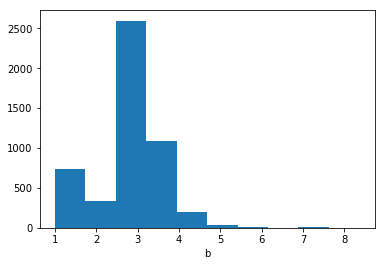

In [574]:
plt.hist(a_list)
plt.xlabel('a')
plt.show()
plt.hist(b_list)
plt.xlabel('b')
plt.show()

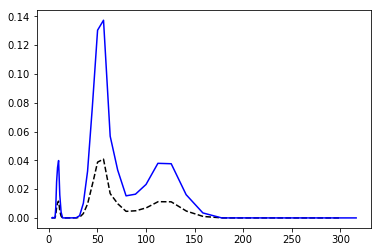

In [33]:
"""
# Interpolating all of the SNe together
x_interp = np.linspace(3, 300, 1000)

prob_08ha = np.load("New_Start(2017)/08ha_Mag_probs.npy")
prob_08ha_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_08ha[:])

prob_10ae = np.load("New_Start(2017)/10ae_Mag_probs.npy")
prob_10ae_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_10ae[:])
prob_10el = np.load("New_Start(2017)/10el_Mag_probs.npy")
prob_10el_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_10el[:])
prob_12Z = np.load("New_Start(2017)/12Z_Mag_probs.npy")
prob_12Z_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_12Z[:])
prob_14ck = np.load("New_Start(2017)/14ck_Mag_probs.npy")
prob_14ck_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_14ck[:])

prob_tot_interp = (prob_08ha_interp/np.sum(prob_08ha_interp) + prob_10ae_interp/np.sum(prob_10ae_interp)
                         + prob_10el_interp/np.sum(prob_10el_interp) + prob_12Z_interp/np.sum(prob_12Z_interp)
                         + prob_14ck_interp/np.sum(prob_14ck_interp))
prob_tot_norm = prob_tot_interp/5.


plt.plot(x_interp, prob_tot_interp, 'k--')
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_summed, 'b-')
"""

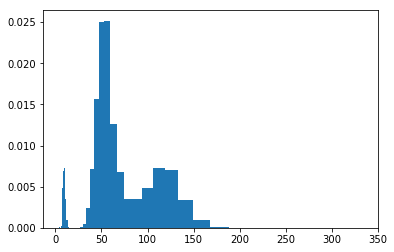

[0.0, 0.0, 5.5851979278008422e-42, 6.1293407444782876e-17, 5.9901112827657093e-08, 2.2757963947861522e-07, 2.5755288568261661e-07, 6.2903061528858912e-07, 1.6744879085226092e-06, 3.6216018899386431e-06, 9.9219403016550735e-06, 1.2306539899550176e-05, 1.2481867938847788e-05, 1.6669992987244994e-05, 3.8185955150039215e-05, 6.1132482401514998e-05, 6.2108439412962975e-05, 8.2061362636673971e-05, 9.5564235249916737e-05, 0.00019731899626876181, 0.000504657528853777, 0.00089953303120052924, 0.00097578454365715873, 0.0017204449436333993, 0.0024217214708829936, 0.0033993250530197708, 0.003439712816663719, 0.0034487234972563436, 0.003519304781412773, 0.0048411512985343302, 0.0048792906126197627, 0.0067289043715687115, 0.006892419087205265, 0.0069638607282631023, 0.0071222069368049104, 0.0072224196442889858, 0.0072292022425457566, 0.012622464813674716, 0.015679877475353356, 0.024984747884152742, 0.025162679204316106]


In [36]:
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_tot, width = widths_mod, align='center')
plt.show()
print(sorted(heights_tot))
#min_height = np.min(heights_tot[np.nonzero(heights_tot)])
#print(heights_tot/min_height)

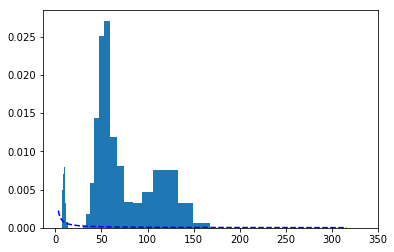

1.00711958167


In [733]:
# Least squares fit to power law w/ cut off
import scipy.optimize as optimize
def pow_law(x, coeffs):
    c = (coeffs[1] - 1)/coeffs[0]**(1 - coeffs[1])
    return np.piecewise(x, [x < coeffs[0], x >= coeffs[0]], [0, lambda x: c * x**(- coeffs[1])])

def expon(x, coeffs):
    return np.piecewise(x, [x < coeffs[0], x >= coeffs[0]], [0, lambda x: coeffs[1] * np.exp(- coeffs[1] * (x - coeffs[0]))])

def residuals(coeffs, y, x):
    return y - pow_law(x, coeffs)

ln_sum = np.sum(np.log(10**(CChi[0,3,1:,3,0])/1e6))
x0 = np.array([3, 1 + 1/ln_sum], dtype=float)
#arr, cov = optimize.leastsq(residuals, x0, args=(prob_tot_interp, x_interp))

#plt.plot(x_interp, prob_tot_norm, 'k-')
#x0 = [59.7621331666, 3.04844591312, 23.3862379494]
plt.plot(10**(CChi[0,3,:,3,0])/1e6, pow_law(10**(CChi[0,3,:,3,0])/1e6, x0), 'b--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, prob_summed/5., width = widths_mod, align='center')
plt.show()
print(1 + 1/ln_sum)

#plt.plot(x_interp, residuals(arr, prob_tot_norm, x_interp))

In [734]:
# Trying out emcee
def lnlike(theta,x,y): #power law lnlike
    #x is the location of the breaks for the bar graph
    #y is the heights of the bar graph, that is the summed 5 observations
    #(y is not normalized to 1, it is normalized to 5)
    #this means len(x) = len(y) + 1
    a,b = theta
    c = (b - 1)/a**(1 - b)
    l = np.zeros_like(y)
    for i in range(len(y)):
        #if y[i] == 0: #then don't do probability calculation
        #    ll[i] = 0
        #elif x[i+1] < a: #then both x bounds are below cutoff
        #    ll[i] = -np.inf
        #elif x[i] <= a: #then upper x is bigger, but lower is less
        #    integral = (1/a**(1-b))*(a**(1-b)-x[i+1]**(1-b)) #this is the integral of being between a and upper x
        #    ll[i] = y[i]*np.log(integral) 
        #else: #both bounds above a
        #    integral = (1/a**(1-b))*(x[i]**(1-b)-x[i+1]**(1-b)) #this is the integral of being between lower and upper x
        #    ll[i] = y[i]*np.log(integral) 
        if y[i] == 0:
            l[i] = 0
        elif x[i+1] < a:
            l[i] = 0
        elif x[i] <= a:
            integral = (1/a**(1-b))*(a**(1-b)-x[i+1]**(1-b))
            l[i] = y[i] * (x[i+1] - x[i])/2 * integral
        else:
            integral = (1/a**(1-b))*(x[i]**(1-b)-x[i+1]**(1-b))
            l[i] = y[i] * (x[i+1] - x[i]) * integral
    return np.log(np.sum(l))

def lnlike_exp(theta,x,y): #exponential law lnlike
    #x is the location of the breaks for the bar graph
    #y is the heights of the bar graph, that is the summed 5 observations
    #(y is not normalized to 1, it is normalized to 5)
    #this means len(x) = len(y) + 1
    a,b = theta
    ll = np.zeros_like(y)
    for i in range(len(y)):
        if y[i] == 0: #then don't do probability calculation
            ll[i] = 0
        elif x[i+1] < a: #then both x bounds are below cutoff
            ll[i] = -np.inf
        elif x[i] <= a: #then upper x is bigger, but lower is less
            integral = 1-np.exp(-b*(x[i+1]-a)) #this is the integral of being between a and upper x
            ll[i] = y[i]*np.log(integral) 
        else: #both bounds above a
            integral = (np.exp(-b*(x[i]-a))-np.exp(-b*(x[i+1]-a))) #this is the integral of being between a and upper x
            ll[i] = y[i]*np.log(integral) 
    return np.sum(ll)

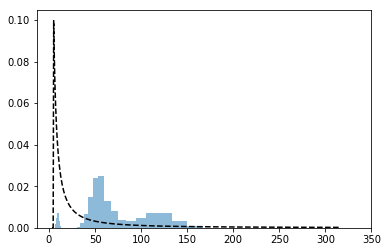

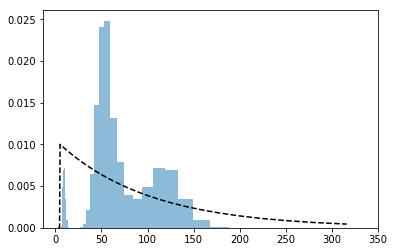

In [735]:
nll = lambda *args: -lnlike(*args)
ln_sum = np.sum(10**(CChi[0,3,:,3,0])/1e6)
x0 = np.array([5, 1.5], dtype=float)
#result = optimize.minimize(nll, x0, args=(10**(CChi[0,3,:,3,0])/1e6, heights_tot))
#a_ml, b_ml = result["x"]
#print(result)

plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_tot, width=widths_mod, alpha=.5)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, pow_law(10**(CChi[0,3,:,3,0])/1e6, x0), 'k--')
plt.show()

x0_exp = np.array([5, .01], dtype=float)

plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_tot, width=widths_mod, alpha=.5)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, expon(10**(CChi[0,3,:,3,0])/1e6, x0_exp), 'k--')

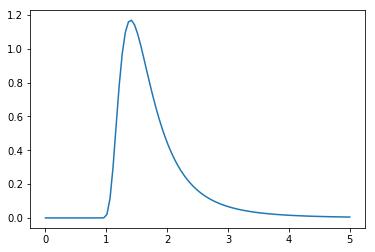

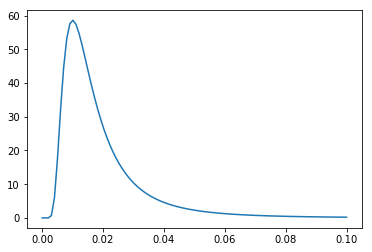

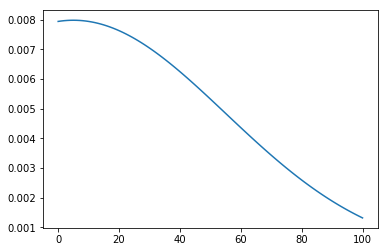

In [736]:
b_array = np.linspace(0,5, 100)
plt.plot(b_array, stats.invgamma.pdf(b_array, 4, loc=.8, scale=3))
plt.show()

b_array = np.linspace(0,.1, 100)
plt.plot(b_array, stats.invgamma.pdf(b_array, 3, loc=0, scale=0.04))
plt.show()
a_array = np.linspace(0, 100, 100)
plt.plot(a_array, stats.norm.pdf(a_array, loc=5, scale=50))

In [737]:
import scipy.stats as stats

def lnprior(theta):
    a, b = theta
    lp = 0
    #if a > 0:
    #    lp += stats.norm.logpdf(a, loc=5, scale=100)
    if a > 0:
        lp+= stats.uniform.logpdf(a, loc=0, scale=100)
    else: return -np.inf
    
    if b > 1:
        #lp += stats.invgamma.logpdf(b, 3, loc=0, scale=6)
        lp += stats.invgamma.logpdf(b, 4, loc=.8, scale=3) #2, loc=1, scale=2)
    else: return -np.inf
    return lp

def lnprior_exp(theta):
    a, b = theta
    lp = 0
    if a > 0:
        lp += stats.norm.logpdf(a, loc=5, scale=50)
    else: return -np.inf
    
    if b > 0:
        lp += stats.invgamma.logpdf(b, 3, loc=0, scale=0.04)
    else: return -np.inf    
    return lp

In [738]:
def lnprob(theta, x, y):
    lp = lnprior(theta)
    ll = lnlike(theta, x, y)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    #print(np.shape(lp), np.shape(lnlike(theta, x, y)), np.shape(theta))
    return lp + ll

def lnprob_exp(theta, x, y):
    lp = lnprior_exp(theta)
    ll = lnlike_exp(theta, x, y)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

In [739]:
for i in range(41):
    if heights_tot[i] < 1e-4:
        heights_tot[i] = 0
    #print(10**(CChi[0,3,i,3,0])/1e6, heights_tot[i])

In [740]:
ndim, nwalkers, nsteps = x0.shape[0], 100, 1000
pos = []
pos_exp = []

i = 0
while i < nwalkers:
    pos_test = [x0[0] + 10*np.random.randn(), x0[1] + np.random.randn()] #x0 + np.random.randn(ndim)
    lp = lnprior(pos_test)
    if np.isfinite(lp):
        pos.append(pos_test)
        i += 1

i = 0
while i < nwalkers:
    pos_test_exp = x0_exp + np.random.randn(ndim)
    lp = lnprior_exp(pos_test_exp)
    if np.isfinite(lp):
        pos_exp.append(pos_test_exp)
        i += 1

In [741]:
import emcee
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(breaks_mod, 5*heights_tot)) #(10**(CChi[0,3,:,3,0])/1e6, heights_tot))

sampler_exp = emcee.EnsembleSampler(nwalkers, ndim, lnprob_exp, args=(breaks_mod, 5*heights_tot)) #(10**(CChi[0,3,:,3,0])/1e6, heights_tot))

In [742]:
sampler.run_mcmc(pos, nsteps)

sampler_exp.run_mcmc(pos_exp, nsteps)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in double_scalars
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:29: RuntimeWarning: invalid value encountered in double_scalars
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in log
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:31: RuntimeWarning: divide by zero encountered in log
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:50: RuntimeWarning: invalid value encountered in log
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:47: RuntimeWarning: invalid value encountered in log
//anaconda/lib/python3.5/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
//anaconda/lib/python3.5/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater


(array([[  3.67820432e+00,   1.20305655e-02],
        [  3.22600744e+00,   1.38964904e-02],
        [  6.41057406e+00,   1.53496435e-02],
        [  8.27101586e-01,   2.20194521e-02],
        [  6.62375504e+00,   9.45484232e-03],
        [  1.08791656e+00,   8.73965004e-03],
        [  3.47849362e+00,   6.54646499e-03],
        [  1.43215810e+00,   2.18485009e-02],
        [  4.47827681e+00,   1.79634049e-02],
        [  2.09509521e+00,   1.04229047e-02],
        [  5.25431847e+00,   1.57741353e-02],
        [  4.96104335e+00,   2.45479674e-02],
        [  4.26700330e+00,   1.02586145e-02],
        [  5.00748416e+00,   1.32201529e-02],
        [  4.39331297e+00,   1.08471695e-02],
        [  4.62312220e+00,   2.80134510e-02],
        [  5.96726301e+00,   1.94083572e-02],
        [  9.62111933e-01,   1.30072651e-02],
        [  5.13850450e+00,   2.17871118e-02],
        [  2.48878776e+00,   1.44312593e-02],
        [  5.25352894e+00,   2.71584843e-02],
        [  4.43759726e+00,   8.931

In [743]:
burnin = 0
samples = sampler.chain[:, burnin:, :]

samples_exp = sampler_exp.chain[:, burnin:, :]

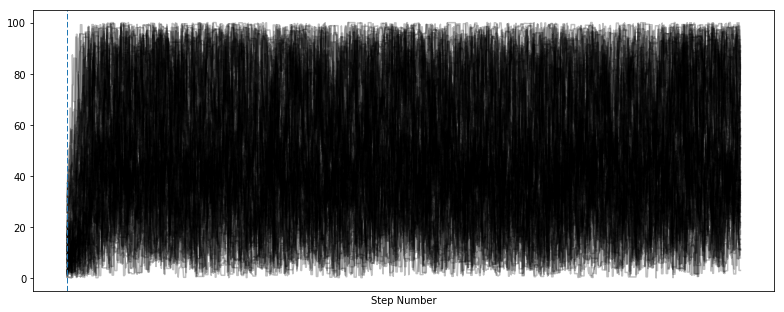

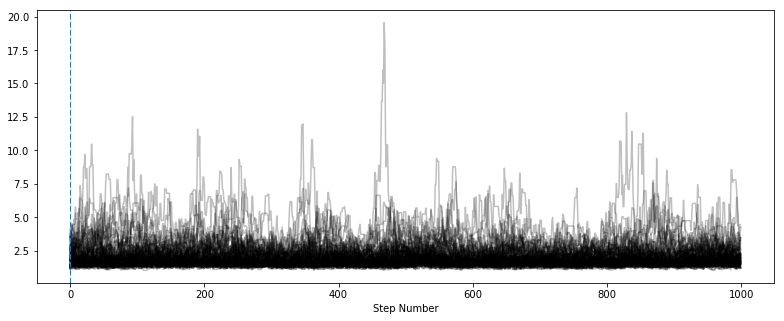

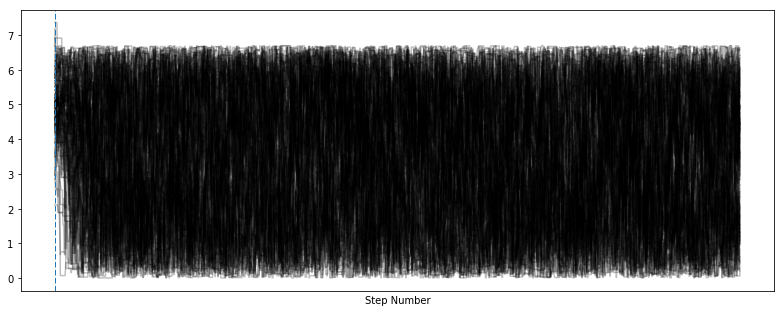

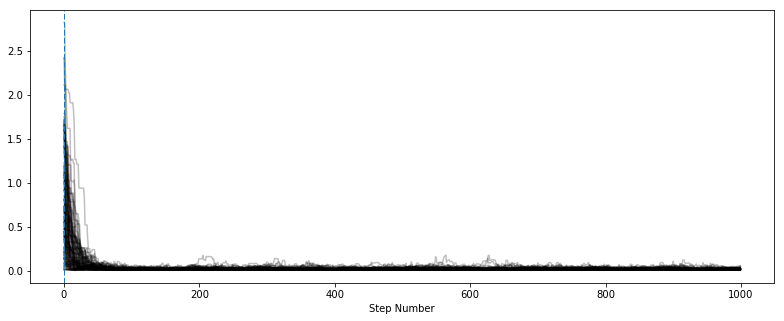

In [744]:
for dim in range(ndim):
    plt.figure(figsize=[11,8.5])
    plt.subplot(ndim,1,dim+1)
    plt.plot(samples[:,:,dim].transpose(),'k',alpha=0.25)
    plt.locator_params(axis='y',nticks=4)
    plt.axvline(x=burnin,linestyle='dashed',lw=1)
    if dim != ndim-1:
        plt.xticks([])
    plt.xlabel('Step Number')
    plt.tight_layout()
    plt.show()

for dim in range(ndim):
    plt.figure(figsize=[11,8.5])
    plt.subplot(ndim,1,dim+1)
    plt.plot(samples_exp[:,:,dim].transpose(),'k',alpha=0.25)
    plt.locator_params(axis='y',nticks=4)
    plt.axvline(x=burnin,linestyle='dashed',lw=1)
    if dim != ndim-1:
        plt.xticks([])
    plt.xlabel('Step Number')
    plt.tight_layout()
    plt.show()

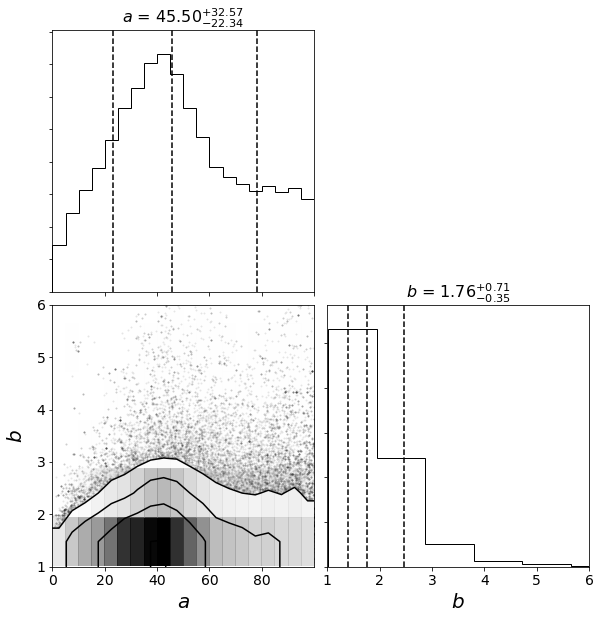

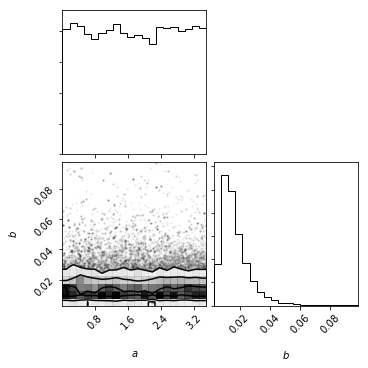

In [745]:
import corner
burnin = 150
samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))

figure = corner.corner(samples, labels=["$a$", "$b$"], quantiles=[0.16, 0.5, 0.84], show_titles=True,
                      title_kwargs={"fontsize": 16}, label_kwargs={"fontsize": 20})
figure.set_size_inches(10, 10)
axes = np.array(figure.axes).reshape((ndim, ndim))
ax1 = axes[0,0]
ax2 = axes[1,0]
ax3 = axes[1,1]
ax1.set_xlim(0,100)
ax2.set_xlim(0,100)
ax2.set_ylim(1,6)
ax2.xaxis.set_label_coords(.5,-.1)
ax2.yaxis.set_label_coords(-.1,.5)
ax2.xaxis.set_ticks([0,20,40,60,80])
ax2.set_xticklabels([0,20,40,60,80], fontsize=14, rotation=0)
ax2.yaxis.set_ticks([1,2,3,4,5,6])
ax2.set_yticklabels([1,2,3,4,5,6], fontsize=14, rotation=0)
ax3.set_xlim(1,6)
ax3.xaxis.set_label_coords(.5,-.1)
ax3.xaxis.set_ticks([1,2,3,4,5,6])
ax3.set_xticklabels([1,2,3,4,5,6], fontsize=14, rotation=0)
plt.show()

burnin = 200
samples_exp = sampler_exp.chain[:, burnin:, :].reshape((-1, ndim))

corner.corner(samples_exp[(samples_exp[:,1] < 0.1) & (samples_exp[:,0] < 3.5),:], labels=["$a$", "$b$"])
plt.show()

(45.504583318477614, 23.160158456747883, 78.071524151327978) (1.7577191209586833, 1.4029562198424965, 2.4664283545841208) 13.6725125725


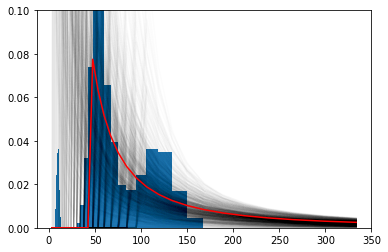

3.50066779436 0.0148463241782


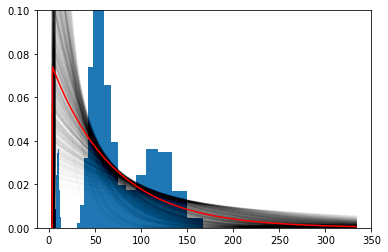

In [746]:
for a, b in samples[np.random.randint(len(samples), size=1000)]:
    plt.plot(breaks_mod, 5*pow_law(breaks_mod, [a,b]), color="k", alpha=0.01)
plt.bar(10**(CChi[0,3,:,3,0])/1e6, 5*heights_tot, width=widths_mod)
a_mcmc, b_mcmc = map(lambda v: (v[1], v[0], v[2]),
                             zip(*np.percentile(samples, [16, 50, 84],
                                                axis=0)))
print(a_mcmc, b_mcmc, (b_mcmc[0] - 1)/a_mcmc[0]**(1 - b_mcmc[0]))
plt.plot(breaks_mod, 5*pow_law(breaks_mod, [a_mcmc[0], b_mcmc[0]]), 'r-')
plt.ylim(0,.1)
plt.show()

for a, b in samples_exp[np.random.randint(len(samples_exp), size=1000)]:
    plt.plot(breaks_mod, 5*expon(breaks_mod, [a,b]), color="k", alpha=0.01)
plt.bar(10**(CChi[0,3,:,3,0])/1e6, 5*heights_tot, width=widths_mod)
a_mcmc, b_mcmc = map(lambda v: v[1],
                             zip(*np.percentile(samples_exp, [16, 50, 84],
                                                axis=0)))
print(a_mcmc, b_mcmc)
plt.plot(breaks_mod, 5*expon(breaks_mod, [a_mcmc, b_mcmc]), 'r-')
plt.ylim(0,.1)
plt.show()

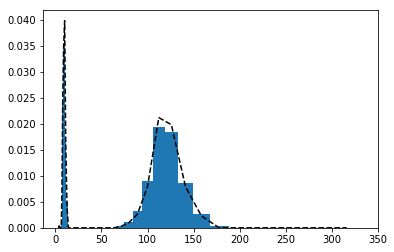

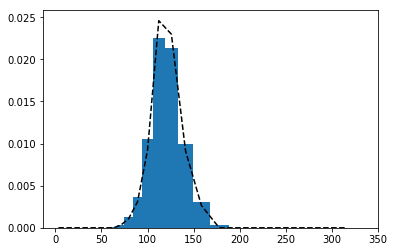

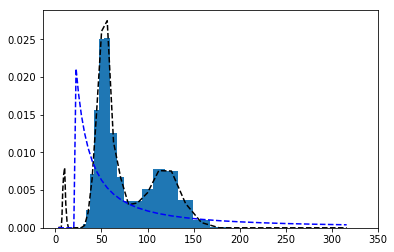

In [489]:
# Now, cut out the lower age for SN 2010ae, and rerun the analysis
prob_10ae2 = np.append(np.zeros(15), prob_10ae[15:])

norm_10ae2 = np.trapz(prob_10ae2, 10**(CChi[0,3,:,3,0])/1e6)
prob_10ae_interp2 = np.interp(x_interp, 10**(CChi[0,3,:,3,0])/1e6, prob_10ae2/norm_10ae2)
#print(np.sum(prob_08ha), np.sum(prob_10ae), np.sum(prob_10ae2))

areas_10ae2 = np.zeros(41)
heights_10ae2 = np.zeros(41)
for i in range(41):
    areas_10ae2[i] = np.trapz(prob_10ae_interp2[2*i:2*i+3], x_interp[2*i:2*i+3])
    heights_10ae2[i] = areas_10ae2[i]/widths_mod[i]

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae/norm_10ae, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_10ae, width=widths_mod)
plt.show()

plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_10ae2/norm_10ae2, 'k--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_10ae2, width=widths_mod)
plt.show()

heights_tot2 = heights_08ha + heights_10ae2 + heights_10el + heights_12Z + heights_14ck
heights_tot2 = heights_tot2/np.sum(heights_tot2*widths_mod)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, prob_summed/5., 'k--')

ln_sum = np.sum(np.log(10**(CChi[0,3,:,3,0])/1e6))
x0 = np.array([20, 1.5], dtype=float)
plt.plot(10**(CChi[0,3,:,3,0])/1e6, pow_law(10**(CChi[0,3,:,3,0])/1e6, x0), 'b--')
plt.bar(10**(CChi[0,3,:,3,0])/1e6, heights_tot2, width = widths_mod, align='center')
plt.show()

In [490]:
for i in range(41):
    if heights_tot2[i] < 1e-4:
        heights_tot2[i] = 0
    print(10**(CChi[0,3,i,3,0])/1e6, heights_tot2[i])

3.16227766017 0.0
3.54813389234 0.0
3.98107170553 0.0
4.46683592151 0.0
5.01187233627 0.0
5.6234132519 0.0
6.3095734448 0.0
7.07945784384 0.0
7.94328234724 0.0
8.91250938134 0.0
10.0 0.0
11.220184543 0.0
12.5892541179 0.0
14.1253754462 0.0
15.8489319246 0.0
17.7827941004 0.0
19.9526231497 0.0
22.3872113857 0.0
25.1188643151 0.0
28.1838293126 0.0
31.6227766017 0.000504657528854
35.4813389234 0.00242172147088
39.8107170553 0.0071222069368
44.6683592151 0.0156798774754
50.1187233627 0.0249847478842
56.234132519 0.0251626792043
63.095734448 0.0126235695957
70.7945784384 0.00673909873875
79.4328234724 0.00355378276761
89.1250938134 0.00354937496492
100.0 0.00516878545892
112.20184543 0.00784982274103
125.892541179 0.00755098609493
141.253754462 0.0036719393397
158.489319246 0.00098368079744
177.827941004 0.0
199.526231497 0.0
223.872113857 0.0
251.188643151 0.0
281.838293126 0.0
316.227766017 0.0


In [498]:
def lnprior(theta):
    a, b = theta
    lp = 0
    if a > 18:
        lp += stats.norm.logpdf(a, loc=20, scale=40)
    else: return -np.inf
    
    if b > 0:
        lp += stats.invgamma.logpdf(b, 4, loc=.8, scale=3)
    else: return -np.inf
    return lp

def lnprob(theta, x, y):
    lp = lnprior(theta)
    ll = lnlike(theta, x, y)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

ndim, nwalkers, nsteps = x0.shape[0], 200, 2000
pos = []

i = 0
while i < nwalkers:
    pos_test = [x0[0] + 10*np.random.randn(), x0[1] + np.random.randn()]
    lp = lnprior(pos_test)
    if np.isfinite(lp):
        pos.append(pos_test)
        i += 1

sampler2 = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(breaks_mod, 5*heights_tot2)) #(10**(CChi[0,3,:,3,0])/1e6, heights_tot2))
sampler2.run_mcmc(pos, nsteps)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:15: RuntimeWarning: divide by zero encountered in log
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:18: RuntimeWarning: divide by zero encountered in log
//anaconda/lib/python3.5/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
//anaconda/lib/python3.5/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))


(array([[ 22.47466927,   1.82755453],
        [ 23.56061839,   2.7984095 ],
        [ 23.77412814,   0.85979976],
        [ 23.66639814,   1.58153839],
        [ 20.39460633,   1.82384772],
        [ 30.62271244,   1.19242816],
        [ 24.07817811,   2.72980441],
        [ 18.78261141,   1.91641305],
        [ 24.53749637,   2.10909399],
        [ 20.07540548,   1.84894033],
        [ 21.73531357,   1.97383979],
        [ 20.02803255,   1.23088257],
        [ 19.74815217,   2.41974265],
        [ 26.73763424,   1.02541129],
        [ 24.19865477,   1.05523267],
        [ 19.88007421,   1.90228087],
        [ 26.02976603,   0.801789  ],
        [ 20.00469507,   2.66351429],
        [ 21.79711269,   1.97934688],
        [ 19.97493319,   3.67538529],
        [ 20.22276344,   0.97209381],
        [ 24.17161806,   1.3595887 ],
        [ 18.12918885,   0.9362256 ],
        [ 18.10838972,   3.1694581 ],
        [ 28.05014009,   1.35789065],
        [ 20.42631215,   1.89919319],
        [ 22

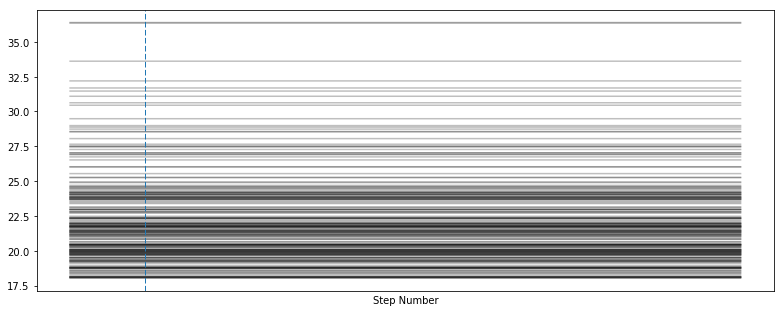

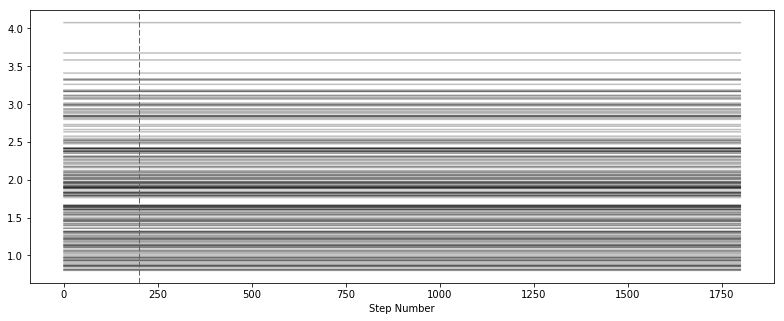

In [499]:
burnin = 200
samples2 = sampler2.chain[:, burnin:, :]

for dim in range(ndim):
    plt.figure(figsize=[11,8.5])
    plt.subplot(ndim,1,dim+1)
    plt.plot(samples2[:,:,dim].transpose(),'k',alpha=0.25)
    plt.locator_params(axis='y',nticks=4)
    plt.axvline(x=burnin,linestyle='dashed',lw=1)
    if dim != ndim-1:
        plt.xticks([])
    plt.xlabel('Step Number')
    plt.tight_layout()
    plt.show()

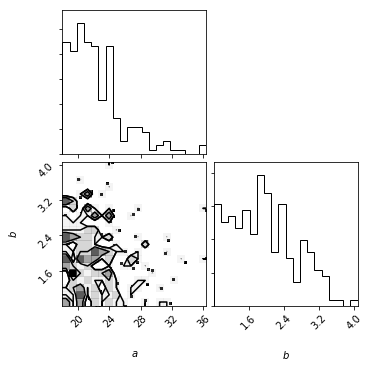

21.6336296424 1.89447918682 13.9899348225


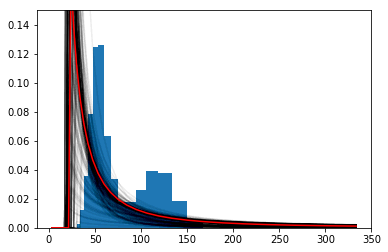

In [500]:
burnin = 200
samples2 = sampler2.chain[:, burnin:, :].reshape((-1, ndim))

corner.corner(samples2, labels=["$a$", "$b$"])
plt.show()

for a, b in samples2[np.random.randint(len(samples2), size=1000)]:
    plt.plot(breaks_mod, 5*pow_law(breaks_mod, [a,b]), color="k", alpha=0.01)
plt.bar(10**(CChi[0,3,:,3,0])/1e6, 5*heights_tot2, width=widths_mod)
a_mcmc, b_mcmc = map(lambda v: v[1],
                             zip(*np.percentile(samples2, [16, 50, 84],
                                                axis=0)))
print(a_mcmc, b_mcmc, (b_mcmc - 1)/a_mcmc**(1 - b_mcmc))
plt.plot(breaks_mod, 5*pow_law(breaks_mod, [a_mcmc, b_mcmc]), 'r-')
plt.ylim(0,.15)
plt.show()

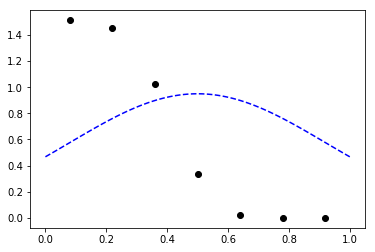

In [367]:
# Compare posterior in reddening to prior
x_array = np.linspace(0,1,100)

norm_red0 = np.sum(probs_red0)
norm_red1 = np.sum(probs_red1)
norm_red2 = np.sum(probs_red2)
norm_red3 = np.sum(probs_red3)
norm_red4 = np.sum(probs_red4)
norm_red5 = np.sum(probs_red5)
norm_red6 = np.sum(probs_red6)

mu = .50
sigma = .42
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
plt.plot(x_array, norm(x_array), 'b--', label='Prior')
plt.plot(reddening, [.9*norm_red0*norm(0.08), .9*norm_red1*norm(0.22), .9*norm_red2*norm(0.36), .9*norm_red3*norm(0.50),
                    .9*norm_red4*norm(0.64), .9*norm_red5*norm(0.78), .9*norm_red6*norm(0.92)], 'ko')

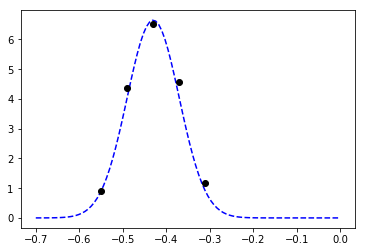

In [27]:
# Compare posterior in metallicity to prior
mu = .50
sigma = .42
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_met0 = (probs[0,0,:]*norm(0.08) + probs[0,1,:]*norm(0.22) + probs[0,2,:]*norm(0.36) + probs[0,3,:]*norm(0.50)
             + probs[0,4,:]*norm(0.64) + probs[0,5,:]*norm(0.78) + probs[0,6,:]*norm(0.92))
probs_met1 = (probs[1,0,:]*norm(0.08) + probs[1,1,:]*norm(0.22) + probs[1,2,:]*norm(0.36) + probs[1,3,:]*norm(0.50)
             + probs[1,4,:]*norm(0.64) + probs[1,5,:]*norm(0.78) + probs[1,6,:]*norm(0.92))
probs_met2 = (probs[2,0,:]*norm(0.08) + probs[2,1,:]*norm(0.22) + probs[2,2,:]*norm(0.36) + probs[2,3,:]*norm(0.50)
             + probs[2,4,:]*norm(0.64) + probs[2,5,:]*norm(0.78) + probs[2,6,:]*norm(0.92))
probs_met3 = (probs[3,0,:]*norm(0.08) + probs[3,1,:]*norm(0.22) + probs[3,2,:]*norm(0.36) + probs[3,3,:]*norm(0.50)
             + probs[3,4,:]*norm(0.64) + probs[3,5,:]*norm(0.78) + probs[3,6,:]*norm(0.92))
probs_met4 = (probs[4,0,:]*norm(0.08) + probs[4,1,:]*norm(0.22) + probs[4,2,:]*norm(0.36) + probs[4,3,:]*norm(0.50)
             + probs[4,4,:]*norm(0.64) + probs[4,5,:]*norm(0.78) + probs[4,6,:]*norm(0.92))

norm_met0 = np.sum(probs_met0)
norm_met1 = np.sum(probs_met1)
norm_met2 = np.sum(probs_met2)
norm_met3 = np.sum(probs_met3)
norm_met4 = np.sum(probs_met4)

mu = -0.43
sigma = .06
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

x_array = np.linspace(-.7,0,100)
plt.plot(x_array, norm(x_array), 'b--')
plt.plot(metallicity, [.22*norm_met0*norm(-0.55), .22*norm_met1*norm(-0.49), .22*norm_met2*norm(-0.43),
                       .22*norm_met3*norm(-0.37), .22*norm_met4*norm(-0.31)], 'ko')

88.027027027
116.864864865
136.189189189


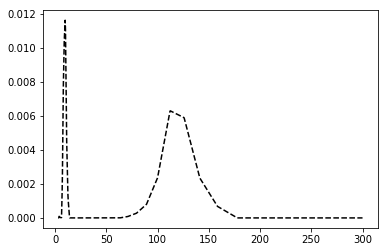

In [646]:
# Confidence Interval for just SN 2010ae
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, probs_tot[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

47.8918918919
63.0540540541
121.027027027


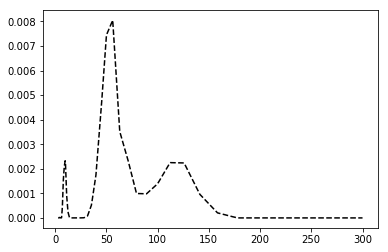

In [747]:
# Confidence Interval for all SNe together
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, prob_summed[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

In [30]:
d200 = 74.4 # 200 pc onsky in pixels
d133 = (2./3) * d200
d67 = (1./3) * d200

info200 = np.zeros(info.shape) # Information for stars between 133 and 200 pc away
info133 = np.zeros(info.shape) # Information for stars between 67 and 133 pc away
info67 = np.zeros(info.shape) # Information for stars less than 67 pc away

for i in range(info.shape[0]):
    d = np.sqrt(np.sum((info[i,2:4] - SN_pos)**2))
    if d <= d67:
        info67[i] = info[i]
    elif d <= d133:
        info133[i] = info[i]
    elif d <= d200:
        info200[i] = info[i]
    else:
        print('Error: object is too far from SN')

info200 = info200[~np.all(info200 == 0, axis=1)]
info133 = info133[~np.all(info133 == 0, axis=1)]
info67 = info67[~np.all(info67 == 0, axis=1)]

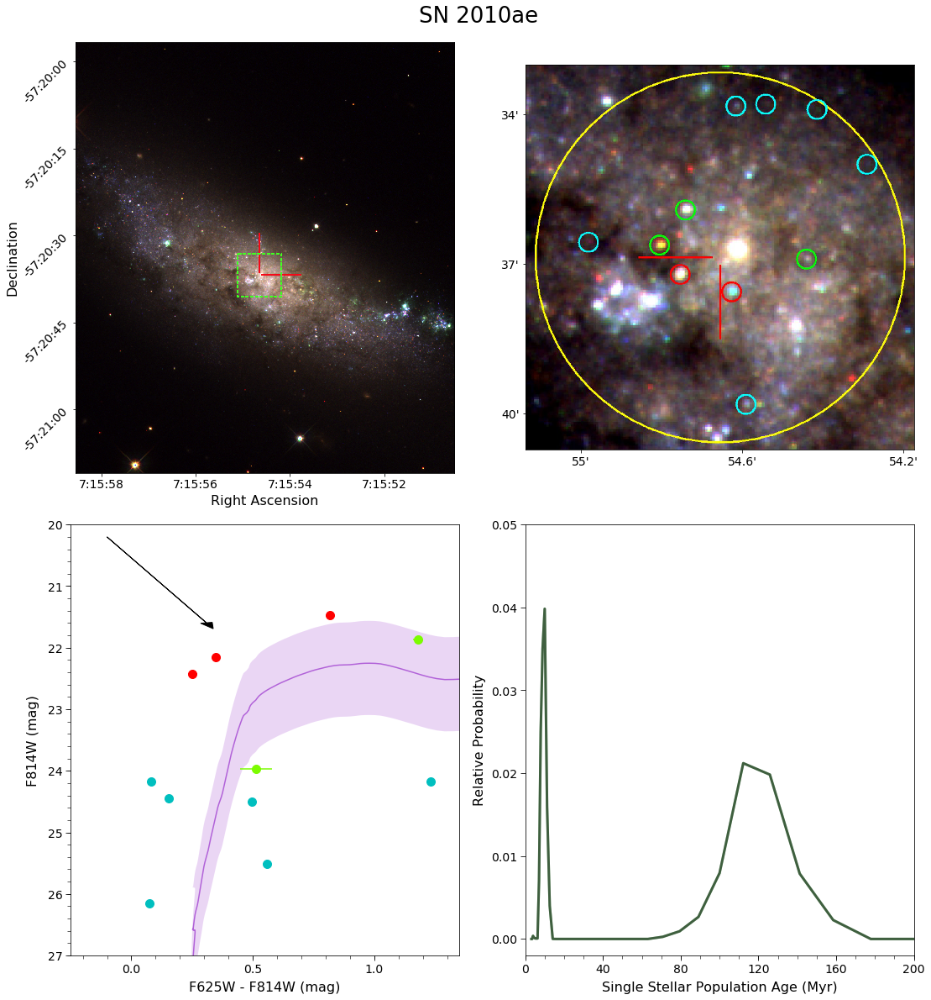

In [31]:
from matplotlib import gridspec
import matplotlib.image as im
from matplotlib.ticker import MultipleLocator

# Setup figure and grid
fig = plt.figure(figsize=(18,20))
gs = gridspec.GridSpec(2, 2)
gs.update(wspace=0.17, hspace=0.12)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[0,0])
image=im.imread(Iax_dir + '/new_files/sn2010ae/2010ae_3.5kpc.4kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 874/(58.552 - 50.505)
x_start = x_tick*.552
ax0.set_xticks([x_start, x_start + 2*x_tick, x_start + 4*x_tick, x_start + 6*x_tick])
ax0.set_xticklabels(['7:15:58', '7:15:56', '7:15:54', '7:15:52'], **tick_font)
y_tick = 993/(130.95 - 56.66)
y_start = y_tick*3.34
ax0.set_yticks([y_start, y_start + 15*y_tick, y_start + 30*y_tick, y_start + 45*y_tick,
                y_start + 60*y_tick])
ax0.set_yticklabels(['-57:20:00', '-57:20:15', '-57:20:30', '-57:20:45', '-57:21:00'],
                    rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Right Ascension", **axis_font)
ax0.set_ylabel("Declination", **axis_font)
ax0.xaxis.set_label_coords(.5, -.05)
#ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.15, .5)
#ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,1])
image=im.imread(Iax_dir + '/new_files/sn2010ae/2010ae_400pc.400pc.JPG')
ax1.imshow(image)
# Setting the ticks
x_tick = 1012/(55.137 - 54.174)
x_start = x_tick*.137
ax1.set_xticks([x_start, x_start + .4*x_tick, x_start + .8*x_tick])
ax1.set_xticklabels(["55'", "54.6'", "54.2'"], **tick_font)
y_tick = 1002/(40.73 - 33.02)
y_start = y_tick*.98
ax1.set_yticks([y_start, y_start + 3*y_tick, y_start + 6*y_tick])
ax1.set_yticklabels(["34'", "37'", "40'"], **tick_font)
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
#ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
#ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,0])
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages > 8.04) & (ages < 8.06)]
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(info200[:,41] - info200[:,54], info200[:,54], 'co', markersize=10)
line2 = ax2.errorbar(info133[:,41] - info133[:,54], info133[:,54], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,43]**2 + info133[:,56]**2), yerr=info133[:,56], markersize=10)
line3 = ax2.errorbar(info67[:,41] - info67[:,54], info67[:,54], fmt='ro',
                     xerr=np.sqrt(info67[:,43]**2 + info67[:,56]**2), yerr=info67[:,56], markersize=10)
# Plots reddening vector
plt.arrow(-.1, 20.2, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.06)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(27,20)
ax2.set_xlim(-0.25, 1.35)
ax2.tick_params(axis='both', which='major', labelsize=14, length=6)
ax2.tick_params(axis='both', which='minor', length=4)
#ax2.set_yticks(np.arange(26, 29))
#ax2.set_xticks(np.arange(-.50,2,.5))
ax2.xaxis.set_major_locator(MultipleLocator(.5))
ax2.xaxis.set_minor_locator(MultipleLocator(.1))
ax2.yaxis.set_major_locator(MultipleLocator(1))
ax2.yaxis.set_minor_locator(MultipleLocator(.2))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[1,1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Single Stellar Population Age (Myr)", **axis_font)
ax3.set_ylabel("Relative Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.06)
ax3.yaxis.set_label_coords(-.1, .5)
ax3.set_xlim(0,200)
ax3.tick_params(axis='both', which='major', labelsize=14, length=6)
ax3.tick_params(axis='both', which='minor', length=4)
ax3.xaxis.set_major_locator(MultipleLocator(40))
ax3.xaxis.set_minor_locator(MultipleLocator(10))
ax3.set_yticks(np.arange(0, .06, .01));

plt.suptitle('SN 2010ae', y=.91, size=26)

plt.savefig('2010ae_Fig.pdf', dpi=1000)

In [32]:
print(info.shape)

(11, 271)


## Correlation Tests

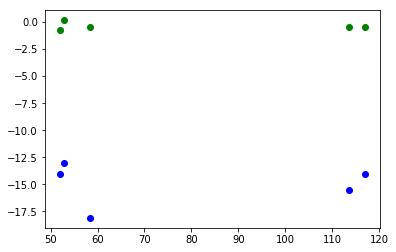

In [632]:
# Chronologically ordered: 08A, 08ge, 08ha, 10ae, 10el, 11ay, 12Z, 14ck
# First, ignoring the SNe with just lower limits
#peak_lums = np.array([-14.19, -14.9, -14.8, -16.8, -17.37])
peak_lums = np.array([-14.0, -14.0, -13.0, -18.1, -15.5]) # From Open Supernova Catalog
mets = np.array([-.78, -.43, .16, -.43, -.51])
ages = np.array([52.05, 116.86, 52.95, 58.30, 113.59])

plt.plot(ages, mets, 'go')
plt.plot(ages, peak_lums, 'bo')

In [633]:
import scipy.stats as stats
print(stats.pearsonr(mets, ages))
print(stats.pearsonr(peak_lums, ages))
print('No correlation found.')

(-0.18880028090283935, 0.76104787800558005)
(0.021766083716353395, 0.97228874989805114)
No correlation found.


## False Star Analysis

In [19]:
x_pos = 1700 + 150*np.random.rand(50)
y_pos = 1820 + 150*np.random.rand(50)

f435w_mags = 17 + 12*np.random.rand(1000) # Range of 17 to 29 in mag
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST"
file = open(Iax_dir + "/new_files/sn2010ae/fake_stars.list", "w+")
for j in range(x_pos.size):
    for i in range(f435w_mags.size):
        file.write('0 1 {x} {y} {f4} {f4} {f4} {f4}\n'.format(x=x_pos[j], y=y_pos[j], f4=f435w_mags[i]))
file.close()

In [19]:
# Loading in the false star test
catalog_false_f435w = np.loadtxt(Iax_dir + "/new_files/sn2010ae/sn2010ae_f435w.fake")
catalog_false_f555w = np.loadtxt(Iax_dir + "/new_files/sn2010ae/sn2010ae_f555w.fake")
catalog_false_f625w = np.loadtxt(Iax_dir + "/new_files/sn2010ae/sn2010ae_f625w.fake")
catalog_false_f814w = np.loadtxt(Iax_dir + "/new_files/sn2010ae/sn2010ae_f814w.fake")

In [20]:
recovered_mags = np.zeros([50000,23]) # 1. X position, 2. Y position, 3. Inserted Mag, 4. Recovered mag (f435w),
# 5. S/N (f435w), 6. Sharpness (f435w), 7. Roundness (f435w), 8. Crowding (f435w), 9.+ same, for other filters
for i in range(catalog_false_f435w.shape[0]):
    # X, Y, and Inserted Magnitude
    recovered_mags[i,0] = catalog_false_f435w[i,2]
    recovered_mags[i,1] = catalog_false_f435w[i,3]
    recovered_mags[i,2] = catalog_false_f435w[i,5]
    # Recovered mag in F435W
    if (catalog_false_f435w[i,14] == 0) and (catalog_false_f435w[i,15] == 0):
        recovered_mags[i,3] = 99.999
    else:
        recovered_mags[i,3] = catalog_false_f435w[i,27]
        recovered_mags[i,4:8] = catalog_false_f435w[i,17:21]
    # Recovered mag in F555W
    if (catalog_false_f555w[i,14] == 0) and (catalog_false_f555w[i,15] == 0):
        recovered_mags[i,8] = 99.999
    else:
        recovered_mags[i,8] = catalog_false_f555w[i,27]
        recovered_mags[i,9:13] = catalog_false_f555w[i,17:21]
    # Recovered mag in F625W
    if (catalog_false_f625w[i,14] == 0) and (catalog_false_f625w[i,15] == 0):
        recovered_mags[i,13] = 99.999
    else:
        recovered_mags[i,13] = catalog_false_f625w[i,27]
        recovered_mags[i,14:18] = catalog_false_f625w[i,17:21]
    # Recovered mag in F814W
    if (catalog_false_f814w[i,14] == 0) and (catalog_false_f814w[i,15] == 0):
        recovered_mags[i,18] = 99.999
    else:
        recovered_mags[i,18] = catalog_false_f814w[i,27]
        recovered_mags[i,19:23] = catalog_false_f814w[i,17:21]

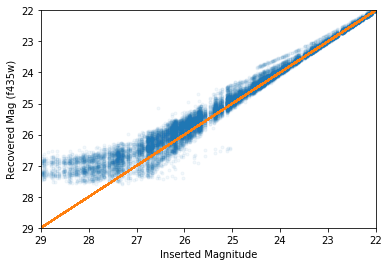

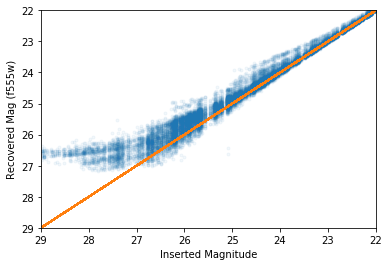

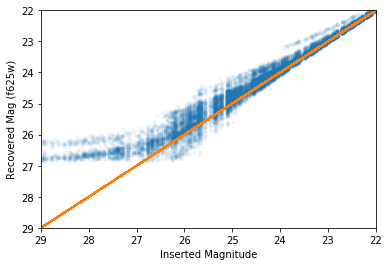

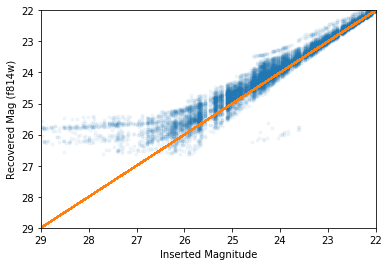

In [21]:
plt.plot(recovered_mags[:,2], recovered_mags[:,3], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f435w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,8], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f555w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,13], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f625w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,18], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f814w)")
plt.show()

In [22]:
f435w_mags = []
f435w_recover = []
f555w_mags = []
f555w_recover = []
f625w_mags = []
f625w_recover = []
f814w_mags = []
f814w_recover = []
# Calculate recovery percentage as a function of inserted mag
for i in range(catalog_false_f435w.shape[0]):
    f435w_mags.append(recovered_mags[i,2])
    f555w_mags.append(recovered_mags[i,2])
    f625w_mags.append(recovered_mags[i,2])
    f814w_mags.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,3]) < .5:
        f435w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,8]) < .5:
        f555w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,13]) < .5:
        f625w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,18]) < .5:
        f814w_recover.append(recovered_mags[i,2])

In [23]:
# Setting up the histogram bins w/ .1 mag resolution
b = []
for i in range(121):
    b.append(17 + i/10.)

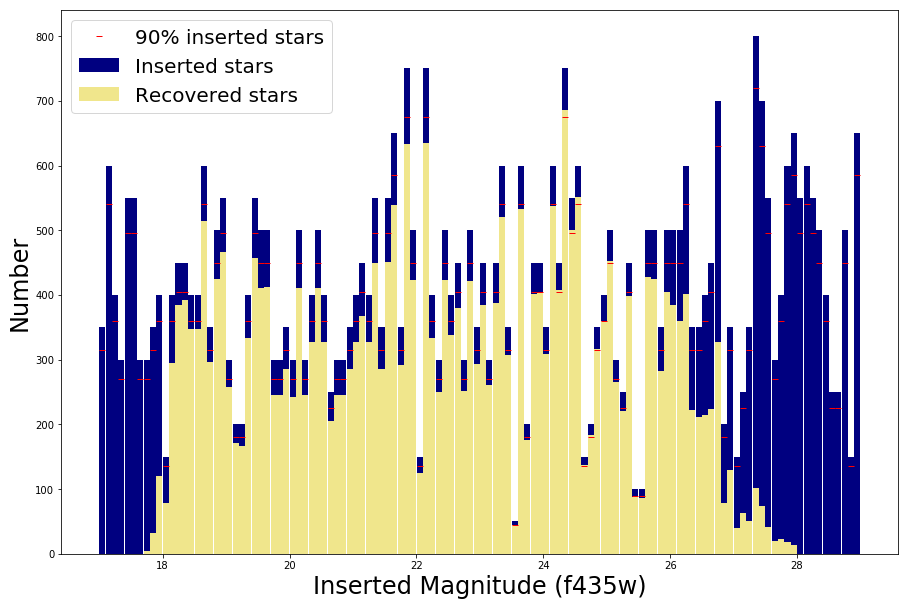

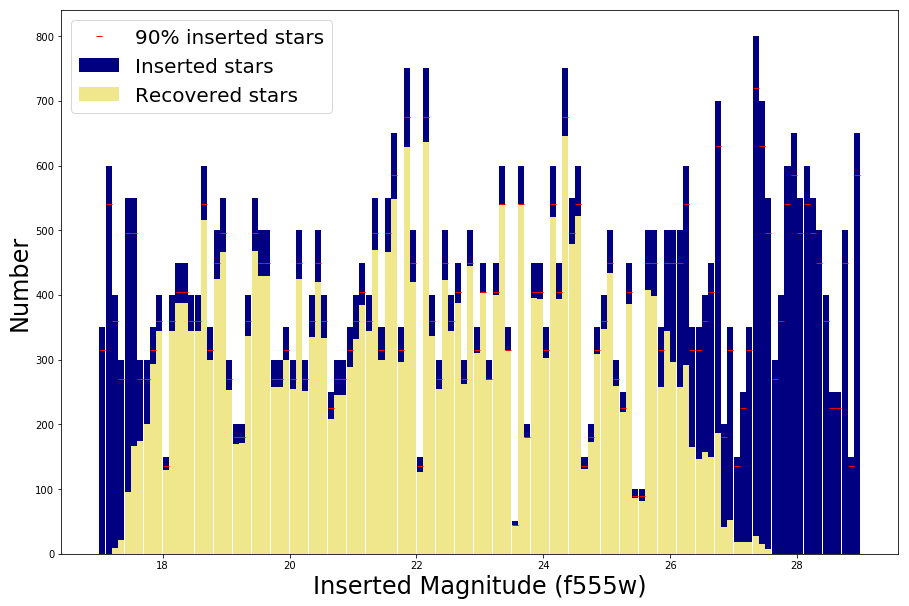

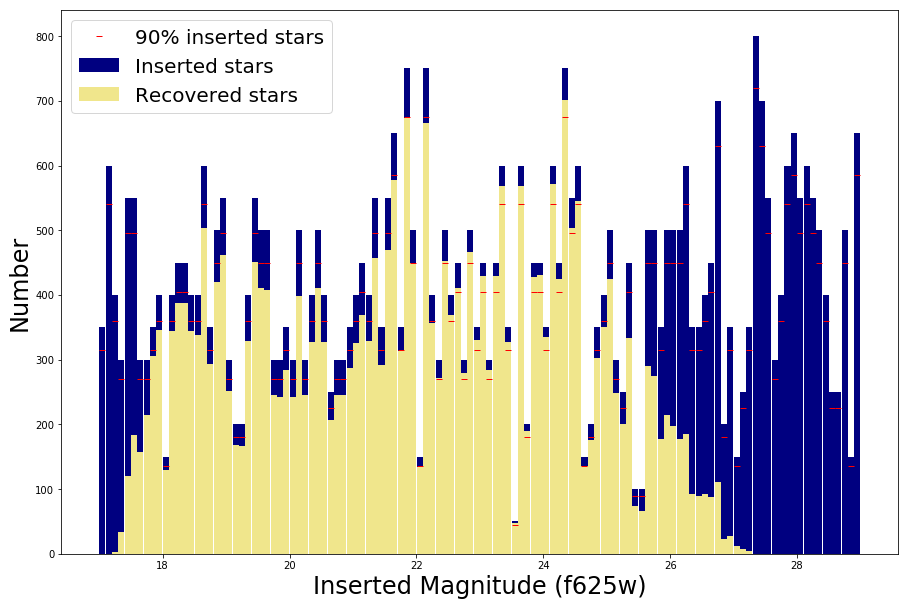

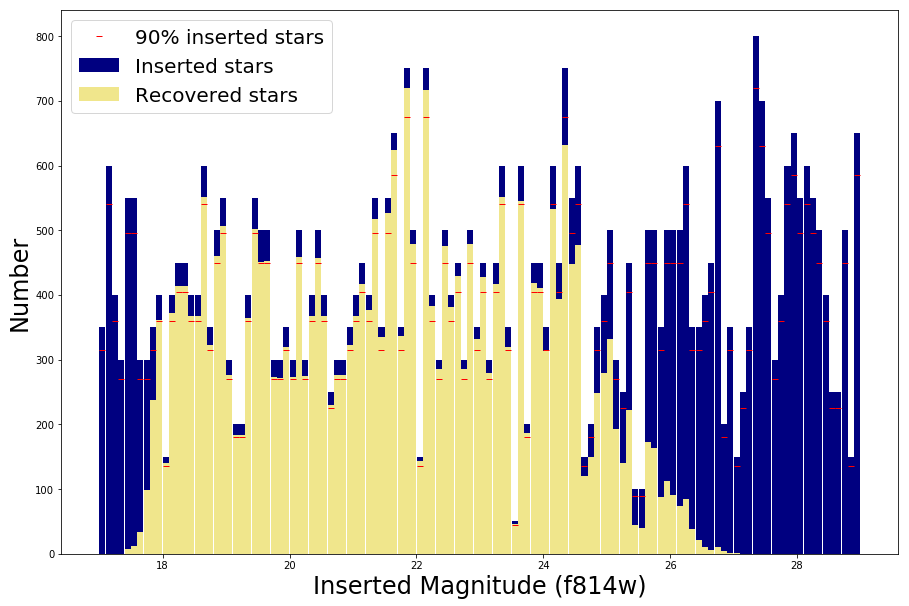

In [24]:
plt.subplots(figsize=(15, 10))
#b = [17,17.5,18,18.5,19,19.5,20,20.5,21,21.5,22,22.5,23,23.5,24,24.5,25,25.5,26,26.5,27,27.5,28,28.5,29,29.5,30]
h4 = plt.hist(f435w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r4 = plt.hist(f435w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h4[1][:-1]+.05, .9*h4[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f435w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h5 = plt.hist(f555w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r5 = plt.hist(f555w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h5[1][:-1]+.05, .9*h5[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f555w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h6 = plt.hist(f625w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r6 = plt.hist(f625w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h6[1][:-1]+.05, .9*h6[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f625w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h8 = plt.hist(f814w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r8 = plt.hist(f814w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h8[1][:-1]+.05, .9*h8[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f814w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

frac_f435w = r4[0]/h4[0]
frac_f555w = r5[0]/h5[0]
frac_f625w = r6[0]/h6[0]
frac_f814w = r8[0]/h8[0]

24.95
23.45
21.95
19.55


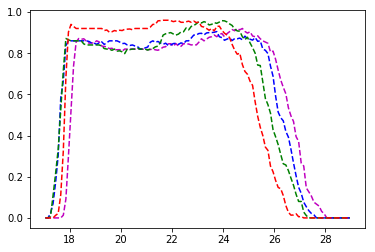

In [25]:
from scipy.interpolate import interp1d

plt.plot(h4[1][:-1]+.05, frac_f435w, 'm--')
plt.plot(h5[1][:-1]+.05, frac_f555w, 'b--')
plt.plot(h6[1][:-1]+.05, frac_f625w, 'g--')
plt.plot(h8[1][:-1]+.05, frac_f814w, 'r--')

print(h4[1][:-1][np.argmin(abs(frac_f435w - .9))] + .05)
print(h5[1][:-1][np.argmin(abs(frac_f555w - .9))] + .05)
print(h6[1][:-1][np.argmin(abs(frac_f625w - .9))] + .05)
print(h8[1][:-1][np.argmin(abs(frac_f814w - .9))] + .05)

In [26]:
# Save recovery fractions and associated magnitudes in two numpy arrays
frac_array = np.array([frac_f435w, frac_f555w, frac_f625w, frac_f814w])
bin_array = np.array([h4[1], h5[1], h6[1], h8[1]])
np.save('10ae_frac.npy', frac_array)
np.save('10ae_bins.npy', bin_array)